# Disaster Image Classification

**Pipeline**: EDA → Data Preparation → Modelling (EfficientNetB2 + SimpleConvNet) → Ensemble → Evaluation

**Classes**: Earthquake · Urban_Fire · Land_Slide · Water_Disaster

**Datasets**:
- Primary: [varpit94/disaster-images-dataset](https://www.kaggle.com/datasets/varpit94/disaster-images-dataset)
- Supplemental Earthquake: [alex1994/natural-disaster-image-dataset](https://www.kaggle.com/datasets/alex1994/natural-disaster-image-dataset)


## 1. Setup

In [1]:
import os, sys, random, json, math, warnings, gc, time, shutil, hashlib
from pathlib import Path
from dataclasses import dataclass
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as sstats
import cv2

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, callbacks

from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import (
    accuracy_score, f1_score, classification_report, confusion_matrix,
    balanced_accuracy_score, log_loss, roc_auc_score,
    precision_recall_fscore_support
)
from scipy.optimize import minimize
from scipy.stats import chisquare
from statsmodels.stats.proportion import proportion_confint

warnings.filterwarnings("ignore")
sns.set_theme(style="whitegrid")
print(f"TensorFlow {tf.__version__} | GPU: {tf.config.list_physical_devices('GPU')}")

2026-05-21 12:54:49.062562: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1779368089.298224      57 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1779368089.363819      57 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1779368089.896016      57 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1779368089.896060      57 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1779368089.896063      57 computation_placer.cc:177] computation placer alr

TensorFlow 2.19.0 | GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


In [2]:
@dataclass
class CFG:
    SEED:         int   = 42
    IMG_SIZE:     int   = 288
    BATCH:        int   = 32
    EVAL_BATCH:   int   = 64
    EPOCHS:       int   = 50
    PATIENCE:     int   = 8
    LR:           float = 3e-4
    NUM_CLASSES:  int   = 4
    N_FOLDS:      int   = 5
    TEST_SPLIT:   float = 0.15
    EXT_EQ_LIMIT:    int   = 400
    WATER_TRAIN_CAP: int   = 600
    LS_TRAIN_TARGET: int   = 500
    OUTPUT_DIR:   str   = "./outputs/"

cfg = CFG()
ROOT    = Path(".")
ART_DIR = ROOT / "artifacts_models"
ART_DIR.mkdir(exist_ok=True)
Path(cfg.OUTPUT_DIR).mkdir(exist_ok=True)

BASE = Path("/kaggle/input/datasets/varpit94/disaster-images-dataset/"
            "Comprehensive Disaster Dataset(CDD)")
DATA_DIRS = {
    "Earthquake"    : BASE / "Damaged_Infrastructure/Earthquake",
    "Urban_Fire"    : BASE / "Fire_Disaster/Urban_Fire",
    "Land_Slide"    : BASE / "Land_Disaster/Land_Slide",
    "Water_Disaster": BASE / "Water_Disaster",
}

EXT_EQ_DIR = Path("/kaggle/input/datasets/ivanwllm/natural-disaster-image-dataset/train/earthquake")

CLASSES   = sorted(DATA_DIRS.keys())
CLS2IDX   = {c: i for i, c in enumerate(CLASSES)}
IDX2CLS   = {i: c for c, i in CLS2IDX.items()}

CLASS_COLOR = {
    "Earthquake"    : "#e74c3c",
    "Land_Slide"    : "#8e44ad",
    "Urban_Fire"    : "#e67e22",
    "Water_Disaster": "#2980b9",
}

print(f"Classes ({len(CLASSES)}): {CLASSES}")
print(f"Class -> index: {CLS2IDX}")

Classes (4): ['Earthquake', 'Land_Slide', 'Urban_Fire', 'Water_Disaster']
Class -> index: {'Earthquake': 0, 'Land_Slide': 1, 'Urban_Fire': 2, 'Water_Disaster': 3}


In [3]:
def seed_everything(seed=42):
    os.environ["PYTHONHASHSEED"] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)

seed_everything(cfg.SEED)
print("Environment ready.")


Environment ready.


## 2. Exploratory Data Analysis

Scan semua folder, filter corrupt, lalu analisa properti image untuk menginformasikan keputusan data preparation.

### 2.1 File Scan & Integrity Check

In [4]:
JPEG_MAGIC = b"\xff\xd8\xff"
PNG_MAGIC  = b"\x89PNG\r\n\x1a\n"
BMP_MAGIC  = b"BM"

def is_valid_image(path):
    try:
        with open(path, "rb") as f:
            hdr = f.read(16)
        if not (hdr.startswith(JPEG_MAGIC) or hdr.startswith(PNG_MAGIC)
                or hdr.startswith(BMP_MAGIC)):
            return False, "bad_header"
        img = cv2.imread(str(path))
        if img is None or img.size == 0:
            return False, "decode_fail"
        if min(img.shape[:2]) < 10:
            return False, "too_small"
        return True, "ok"
    except Exception as e:
        return False, str(e)


def scan_directory(folder, label, limit=None):
    rows, bad = [], []
    paths = [p for p in folder.rglob("*")
             if p.is_file() and p.suffix.lower() in {".jpg",".jpeg",".png",".bmp"}]
    if limit:
        rng = np.random.default_rng(cfg.SEED)
        idx = rng.choice(len(paths), min(limit, len(paths)), replace=False)
        paths = [paths[i] for i in idx]
    for p in paths:
        ok, reason = is_valid_image(p)
        if ok:
            rows.append({"path": str(p), "label": label,
                         "size_kb": p.stat().st_size / 1024})
        else:
            bad.append({"path": str(p), "label": label, "reason": reason})
    return rows, bad


all_rows, all_bad = [], []

for cls, folder in DATA_DIRS.items():
    if not folder.exists():
        print(f"WARNING: {folder} not found"); continue
    rows, bad = scan_directory(folder, cls)
    all_rows.extend(rows); all_bad.extend(bad)

if EXT_EQ_DIR.exists():
    ext_rows, ext_bad = scan_directory(EXT_EQ_DIR, "Earthquake", limit=cfg.EXT_EQ_LIMIT)
    all_rows.extend(ext_rows); all_bad.extend(ext_bad)
    print(f"External earthquake images added: {len(ext_rows)}")
else:
    print(f"WARNING: EXT_EQ_DIR not found -> {EXT_EQ_DIR}")

df_all     = pd.DataFrame(all_rows).reset_index(drop=True)
df_corrupt = pd.DataFrame(all_bad)

print(f"\nValid: {len(df_all)} | Corrupt/skipped: {len(df_corrupt)}")
print("\nPer class:")
print(df_all.label.value_counts().reindex(CLASSES))

External earthquake images added: 400

Valid: 2342 | Corrupt/skipped: 4

Per class:
label
Earthquake         436
Land_Slide         453
Urban_Fire         418
Water_Disaster    1035
Name: count, dtype: int64


**Insight.** File corrupt/invalid dibuang sebelum split — pipeline hanya mengonsumsi gambar yang dapat di-decode OpenCV, sehingga tidak ada data noise dari file rusak yang masuk ke training.

### 2.2 Class Distribution

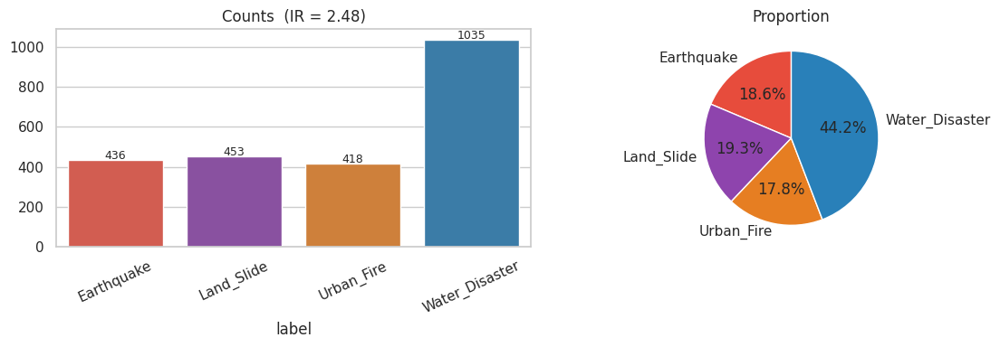

In [5]:
cnt = df_all.label.value_counts().reindex(CLASSES)
ir  = cnt.max() / cnt.min()

fig, ax = plt.subplots(1, 2, figsize=(12, 4))
sns.barplot(x=cnt.index, y=cnt.values, ax=ax[0],
            palette=[CLASS_COLOR[c] for c in cnt.index])
ax[0].set_title(f"Counts  (IR = {ir:.2f})")
ax[0].tick_params(axis="x", rotation=25)
for i, v in enumerate(cnt.values):
    ax[0].text(i, v + 5, str(v), ha="center", fontsize=9)

ax[1].pie(cnt.values / cnt.sum(), labels=cnt.index,
          colors=[CLASS_COLOR[c] for c in cnt.index],
          autopct="%.1f%%", startangle=90)
ax[1].set_title("Proportion")

plt.tight_layout()
plt.savefig(cfg.OUTPUT_DIR + "class_distribution.png", dpi=120)
plt.show()

**Insight.** Water_Disaster over-represented (~1000 images). Earthquake under-represented sebelum penambahan data external. Strategi: downsample Water_Disaster → 750, tambah 1000 earthquake images. Imbalance residual ditangani via focal loss + class weights.

### 2.3 Sample Grid per Class

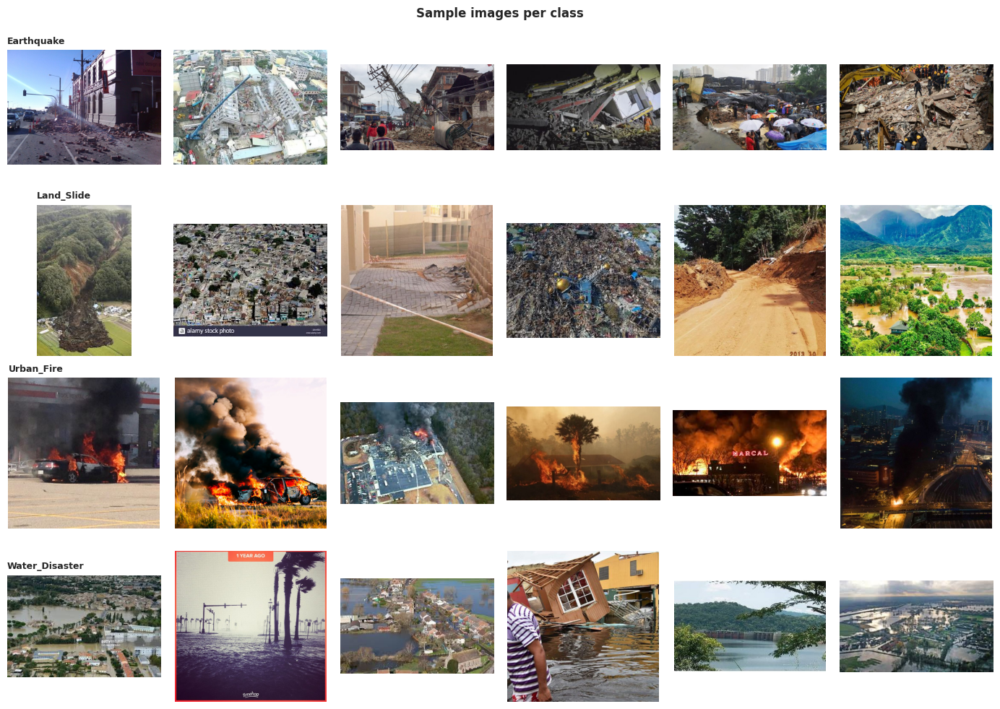

In [6]:
rng    = np.random.default_rng(cfg.SEED)
n_cols = 6
fig, axes = plt.subplots(len(CLASSES), n_cols, figsize=(14, 2.5 * len(CLASSES)))

for r, cls in enumerate(CLASSES):
    paths  = df_all.loc[df_all.label == cls, "path"].values
    chosen = rng.choice(paths, min(n_cols, len(paths)), replace=False)
    for c, p in enumerate(chosen):
        img = cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB)
        axes[r, c].imshow(img); axes[r, c].axis("off")
        if c == 0:
            axes[r, c].set_title(cls, fontsize=9, fontweight="bold", loc="left")

plt.suptitle("Sample images per class", fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig(cfg.OUTPUT_DIR + "sample_grid.png", dpi=120)
plt.show()

**Insight.** Earthquake dan Land_Slide memiliki overlap visual tertinggi (warna tanah, tekstur struktural rusak) — menjadi justifikasi utama fine-tuning EfficientNetB2 pretrained agar feature extractor ImageNet dapat membedakan tekstur diskriminatif yang tidak cukup hanya dipelajari dari scratch.

### 2.4 Image Geometry (Resolution & Aspect Ratio)

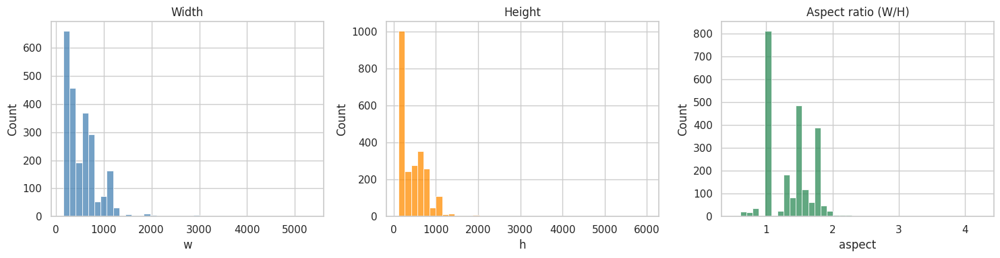

             w        h   aspect       mp
count  2342.00  2342.00  2342.00  2342.00
mean    567.73   457.35     1.36     0.40
std     433.94   354.41     0.35     1.11
min     161.00   119.00     0.51     0.03
25%     283.00   183.00     1.00     0.05
50%     469.00   392.50     1.43     0.18
75%     720.00   640.00     1.60     0.44
max    5337.00  5988.00     4.25    29.05


In [7]:
def img_geom(paths):
    rows = []
    for p in paths:
        h, w = cv2.imread(p).shape[:2]
        rows.append({"w": w, "h": h, "aspect": w / h, "mp": w * h / 1e6})
    return pd.DataFrame(rows)

geom = img_geom(df_all.path.values)
df_all["aspect"] = geom.aspect.values

fig, ax = plt.subplots(1, 3, figsize=(15, 4))
sns.histplot(geom.w,      bins=40, ax=ax[0], color="steelblue");  ax[0].set_title("Width")
sns.histplot(geom.h,      bins=40, ax=ax[1], color="darkorange"); ax[1].set_title("Height")
sns.histplot(geom.aspect, bins=40, ax=ax[2], color="seagreen");   ax[2].set_title("Aspect ratio (W/H)")
plt.tight_layout()
plt.savefig(cfg.OUTPUT_DIR + "geometry.png", dpi=120)
plt.show()

print(geom[["w","h","aspect","mp"]].describe().round(2))

**Insight.** Resolusi sangat heterogen. Aspect ratio mayoritas 1:1 – 4:3. → Gunakan **RandomResizedCrop** (scale 0.7–1.0) + resize 224×224.

### 2.5 File Size & Bytes-per-Pixel

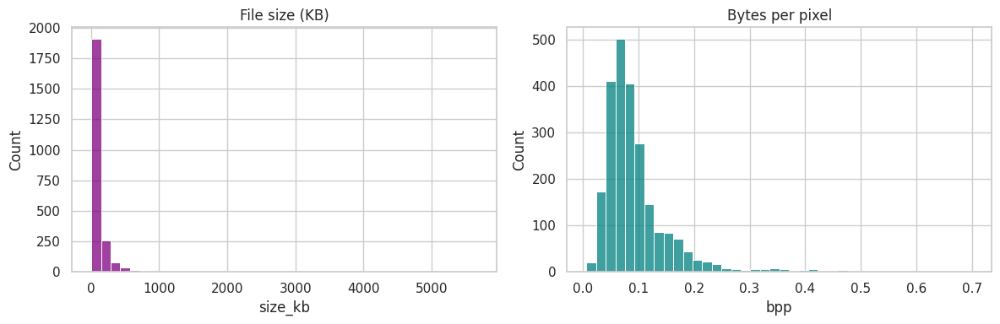

Mean bpp per class:
label
Earthquake        0.143
Land_Slide        0.108
Urban_Fire        0.066
Water_Disaster    0.080
Name: bpp, dtype: float64


In [8]:
df_all["bpp"] = df_all.size_kb.values * 1024 / (
    geom.w.values * geom.h.values * 3
).clip(min=1e-6)

fig, ax = plt.subplots(1, 2, figsize=(12, 4))
sns.histplot(df_all.size_kb, bins=40, ax=ax[0], color="purple");  ax[0].set_title("File size (KB)")
sns.histplot(df_all.bpp,     bins=40, ax=ax[1], color="teal");     ax[1].set_title("Bytes per pixel")
plt.tight_layout()
plt.savefig(cfg.OUTPUT_DIR + "filesize.png", dpi=120)
plt.show()

print("Mean bpp per class:")
print(df_all.groupby("label")["bpp"].mean().round(3).reindex(CLASSES))

**Insight.** bpp bervariasi per kelas → justifikasi augmentasi JPEG compression artifact.

### 2.6 Photometric Statistics per Class

In [9]:
def photo_stats(path, size=128):
    img  = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    img  = cv2.resize(img, (size, size))
    hsv  = cv2.cvtColor(img, cv2.COLOR_RGB2HSV).astype(np.float32)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY).astype(np.float32)
    return {
        "mean_r"    : float(img[..., 0].mean()),
        "mean_g"    : float(img[..., 1].mean()),
        "mean_b"    : float(img[..., 2].mean()),
        "mean_s"    : float(hsv[..., 1].mean()),
        "mean_v"    : float(hsv[..., 2].mean()),
        "brightness": float(gray.mean()),
        "contrast"  : float(gray.std()),
    }

photo_list = [photo_stats(p) for p in df_all.path]
photo_df   = pd.DataFrame(photo_list)
for col in photo_df.columns:
    df_all[col] = photo_df[col].values

print("Photometric stats added to df_all.")
print(df_all.groupby("label")[list(photo_df.columns)].mean().round(2).reindex(CLASSES))

Photometric stats added to df_all.
                mean_r  mean_g  mean_b  mean_s  mean_v  brightness  contrast
label                                                                       
Earthquake      115.57  111.93  108.62   50.93  122.39      112.64     59.41
Land_Slide      115.41  112.92  104.80   57.10  123.14      112.74     51.52
Urban_Fire      115.65   95.27   83.26   98.38  122.13      100.00     53.95
Water_Disaster  126.10  125.71  118.22   53.17  134.94      124.97     51.34


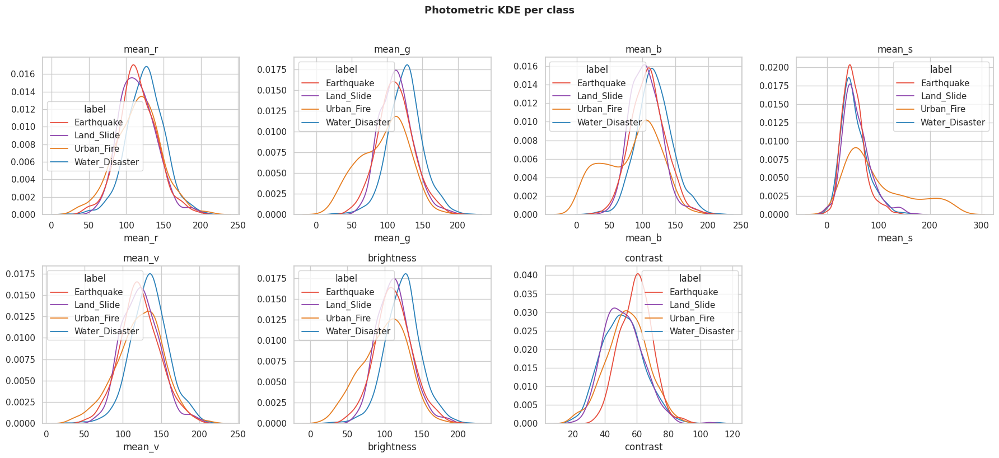

Kruskal-Wallis H test (H0: distribusi sama di semua kelas)
  mean_r        H=   104.8   p=1.48e-22
  mean_g        H=   308.4   p=1.51e-66
  mean_b        H=   251.8   p=2.66e-54
  mean_s        H=   216.6   p=1.10e-46
  mean_v        H=   132.3   p=1.73e-28
  brightness    H=   255.3   p=4.78e-55
  contrast      H=   160.7   p=1.31e-34
  aspect        H=   145.9   p=2.07e-31
  bpp           H=   864.2   p=5.03e-187


In [10]:
metrics = ["mean_r","mean_g","mean_b","mean_s","mean_v","brightness","contrast"]

fig, axes = plt.subplots(2, 4, figsize=(18, 8))
for ax, m in zip(axes.flat, metrics):
    sns.kdeplot(data=df_all, x=m, hue="label", hue_order=CLASSES,
                palette=[CLASS_COLOR.get(c, "#aaaaaa") for c in CLASSES],
                common_norm=False, ax=ax, lw=1.3, fill=False)
    ax.set_title(m); ax.set_ylabel("")
axes.flat[-1].axis("off")
plt.suptitle("Photometric KDE per class", y=1.02, fontsize=13, fontweight="bold")
plt.tight_layout()
plt.savefig(cfg.OUTPUT_DIR + "photometric_kde.png", dpi=120)
plt.show()

print("Kruskal-Wallis H test (H0: distribusi sama di semua kelas)")
for m in metrics + ["aspect", "sharpness", "bpp"]:
    if m not in df_all.columns: continue
    groups = [df_all.loc[df_all["label"] == c, m].values for c in CLASSES]
    H, p   = sstats.kruskal(*groups)
    print(f"  {m:12s}  H={H:8.1f}   p={p:.2e}")

**Insight.** p-value kecil di hampir semua metrik → perbedaan distribusi photometric antar kelas signifikan secara statistik. Urban_Fire: mean_r tinggi (api). Water_Disaster: mean_b dominan. Mitigasi: **ColorJitter agresif** pada augmentasi training.

### 2.7 Sharpness (Laplacian Variance)

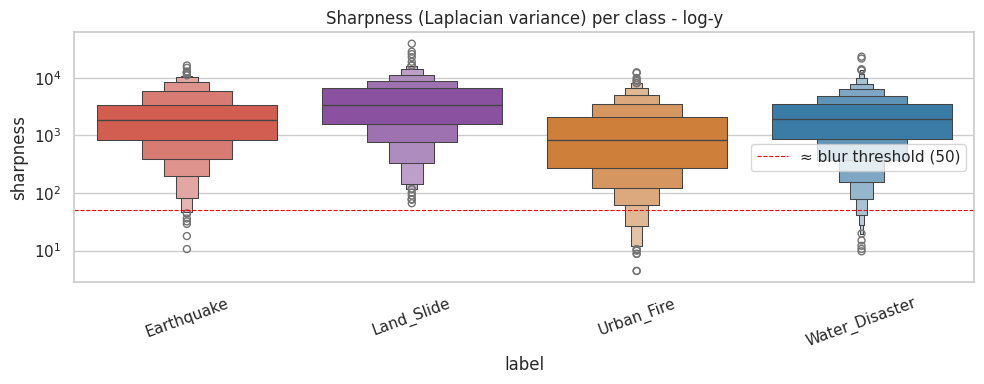

Sangat-blur (Laplacian var < 50) per kelas:
                n_blur  pct
label                      
Earthquake           9  2.1
Land_Slide           0  0.0
Urban_Fire          24  5.7
Water_Disaster      21  2.0


In [11]:
def compute_sharpness(path):
    g = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    return float(cv2.Laplacian(g, cv2.CV_64F).var())

df_all["sharpness"] = [compute_sharpness(p) for p in df_all.path]

fig, ax = plt.subplots(figsize=(10, 4))
sns.boxenplot(data=df_all, x="label", y="sharpness", order=CLASSES,
              palette=[CLASS_COLOR.get(c, "#aaaaaa") for c in CLASSES], ax=ax)
ax.set_yscale("log"); ax.set_title("Sharpness (Laplacian variance) per class - log-y")
ax.axhline(50, color="red", ls="--", lw=0.8, label="≈ blur threshold (50)")
ax.legend(); ax.tick_params(axis="x", rotation=20)
plt.tight_layout()
plt.savefig(cfg.OUTPUT_DIR + "sharpness.png", dpi=120)
plt.show()

blur_tail = (df_all.assign(very_blur=df_all["sharpness"] < 50)
                   .groupby("label")["very_blur"]
                   .agg(["sum","mean"]).rename(columns={"sum":"n_blur","mean":"pct"}))
blur_tail["pct"] = (blur_tail["pct"] * 100).round(1)
print("Sangat-blur (Laplacian var < 50) per kelas:")
print(blur_tail.to_string())

**Insight.** Proporsi gambar sangat blur berbeda antar kelas. GaussianBlur augmentation dengan p=0.2 reasonable sebagai regularisasi.

### 2.8 Per-class Mean Image

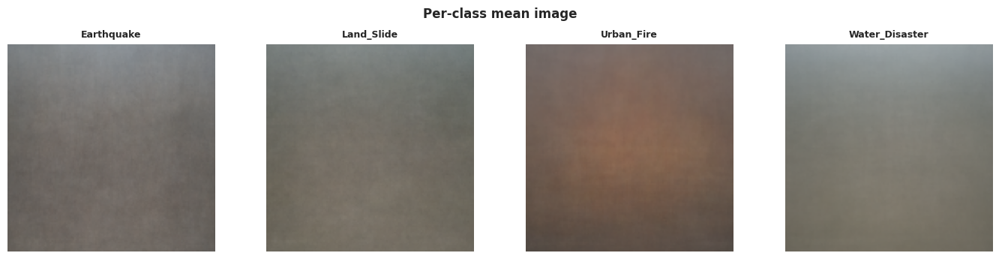

In [12]:
def mean_image(paths, size=128):
    acc = np.zeros((size, size, 3), np.float64)
    for p in paths:
        acc += cv2.resize(cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB),
                          (size, size)).astype(np.float64)
    return (acc / len(paths)).astype(np.uint8)

fig, axes = plt.subplots(1, len(CLASSES), figsize=(14, 3.5))
for ax, cls in zip(axes, CLASSES):
    paths = df_all.loc[df_all.label == cls, "path"].values
    ax.imshow(mean_image(paths)); ax.axis("off")
    ax.set_title(cls, fontsize=9, fontweight="bold")
plt.suptitle("Per-class mean image", fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig(cfg.OUTPUT_DIR + "mean_images.png", dpi=120)
plt.show()

**Insight.** Mean image per kelas mengonfirmasi color signature berbeda (merah dominan Urban_Fire, biru dominan Water_Disaster) — augmentasi Hue dibatasi ±0.03 agar signature warna ini tetap terjaga sebagai fitur diskriminatif, bukan dihapus oleh augmentasi agresif.

### 2.9 EDA Summary & Implikasi

| Temuan EDA | Implikasi ke Pipeline |
|---|---|
| Water_Disaster ~1000 (terlalu banyak) | Downsample ke **750** |
| Earthquake under-represented | Tambah **1000 external images** |
| IR = 2.48 (mild) | **Oversampling** minority + **class_weight** di `.fit()` |
| Resolusi heterogen, aspect ratio 1:1–4:3 | **RandomResizedCrop** scale 0.85–1.0 + resize 224×224 |
| Urban_Fire: saturation 98 vs ~52-57 kelas lain *(strongest signal)* | **Hue ±0.03** (sangat ringan) + **Saturation 0.85–1.15** |
| Brightness & contrast signifikan per kelas (p < 0.01) | **Brightness ±0.2**, **Contrast 0.85–1.15** |
| Blur < 6% semua kelas | Tidak perlu GaussianBlur augmentation |
| bpp variance tinggi (H=1369.6) | JPEG artifact augmentation (opsional) |

## 3. Data Preparation

### 3.1 Exact Duplicate Detection (MD5)

Hash file byte-level. Cross-class duplicates → bocor train/test, **wajib dibuang**.

In [13]:
import hashlib

def file_hash(path, chunk_size=65536):
    h = hashlib.md5()
    with open(path, 'rb') as f:
        while True:
            chunk = f.read(chunk_size)
            if not chunk: break
            h.update(chunk)
    return h.hexdigest()

print('Computing MD5 hashes...')
df_all['hash'] = df_all['path'].apply(file_hash)

dup_mask = df_all.duplicated(subset='hash', keep=False)
dup_df   = df_all[dup_mask].sort_values('hash')
print(f'Exact duplicates : {len(dup_df)} files in {dup_df.hash.nunique()} groups')

cross_class = (dup_df.groupby('hash')['label'].nunique() > 1).sum()
print(f'Cross-class dups : {cross_class} groups (dangerous)')

before = len(df_all)
df_all = df_all.drop_duplicates(subset='hash', keep='first').reset_index(drop=True)
print(f'Dropped {before - len(df_all)} exact duplicates -> {len(df_all)} files')


Computing MD5 hashes...
Exact duplicates : 202 files in 100 groups
Cross-class dups : 38 groups (dangerous)
Dropped 102 exact duplicates -> 2240 files


### 3.2 Near-Duplicate Detection (perceptual hash)

`pHash` mendeteksi gambar dengan konten visual sama walau byte berbeda (resize, recompress). Pakai exact-match pHash → precision tinggi (~99%), recall ~70-85%, zero risk false-positive.

In [14]:
import subprocess, sys
try:
    import imagehash
except ImportError:
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', 'imagehash'])
    import imagehash
from PIL import Image

def phash(path):
    try:
        return str(imagehash.phash(Image.open(path)))
    except Exception:
        return None

print('Computing perceptual hashes...')
df_all['phash'] = df_all['path'].apply(phash)
df_all = df_all[df_all.phash.notna()].reset_index(drop=True)

near_dup_groups = (df_all.groupby('phash').size() > 1).sum()
cross_class_phash = (df_all.groupby('phash')['label'].nunique() > 1).sum()
print(f'Near-duplicate groups       : {near_dup_groups}')
print(f'Cross-class near-dup groups : {cross_class_phash} (potential mislabels)')

before = len(df_all)
df_all = df_all.drop_duplicates(subset='phash', keep='first').reset_index(drop=True)
print(f'Dropped {before - len(df_all)} near-duplicates -> {len(df_all)} files')
print('\nClass distribution after dedup:')
print(df_all.label.value_counts().reindex(CLASSES))


Computing perceptual hashes...
Near-duplicate groups       : 17
Cross-class near-dup groups : 1 (potential mislabels)
Dropped 17 near-duplicates -> 2223 files

Class distribution after dedup:
label
Earthquake         424
Land_Slide         397
Urban_Fire         398
Water_Disaster    1004
Name: count, dtype: int64


### 3.3 Label Quality Audit (pretrained features + cleanlab)

Audit kualitas label via **EfficientNetB0 pretrained (frozen)** → OOF logistic regression → `cleanlab.find_label_issues`.

**Strategi konservatif (penting):**
- Auto-drop hanya **mislabel yang sangat jelas** — threshold ekstrem: `self_conf < 0.01` DAN `pred_conf > 0.9` DAN gap besar (>0.85)
- Hard examples (genuinely ambiguous) **dibiarkan** — model perlu belajar dari sample sulit
- Per-class visualisasi disediakan untuk manual judgment kalau perlu drop lebih banyak

In [15]:
import subprocess, sys
try:
    from cleanlab.filter import find_label_issues
except ImportError:
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', 'cleanlab'])
    from cleanlab.filter import find_label_issues

from tensorflow.keras.applications import EfficientNetB0
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold

AUDIT_SIZE, AUDIT_BATCH = 224, 64

feat_extractor = EfficientNetB0(
    include_top=False, weights='imagenet',
    input_shape=(AUDIT_SIZE, AUDIT_SIZE, 3), pooling='avg'
)
feat_extractor.trainable = False
print(f'Feature extractor: EfficientNetB0 @ {AUDIT_SIZE}px (frozen ImageNet)')


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 306.1/306.1 kB 7.4 MB/s eta 0:00:00


I0000 00:00:1779368237.757658      57 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1779368237.763463      57 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Feature extractor: EfficientNetB0 @ 224px (frozen ImageNet)


In [16]:
def _audit_load(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=3, expand_animations=False)
    img = tf.cast(img, tf.float32)
    return tf.image.resize(img, [AUDIT_SIZE, AUDIT_SIZE])

audit_ds = (tf.data.Dataset.from_tensor_slices(df_all['path'].values)
            .map(_audit_load, num_parallel_calls=tf.data.AUTOTUNE)
            .batch(AUDIT_BATCH).prefetch(tf.data.AUTOTUNE))

print(f'Extracting features for {len(df_all)} images...')
t0 = time.time()
features = feat_extractor.predict(audit_ds, verbose=1)
print(f'Done: {features.shape}  ({time.time()-t0:.1f}s)')


Extracting features for 2223 images...


I0000 00:00:1779368243.021566     145 service.cc:152] XLA service 0x79de0402d890 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1779368243.021620     145 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1779368243.021626     145 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1779368243.938189     145 cuda_dnn.cc:529] Loaded cuDNN version 91002
2026-05-21 12:57:31.555740: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 12:57:31.713652: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 12:57:32.113124: E external/local_xl

34/35 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step

2026-05-21 12:57:50.047047: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 12:57:50.197595: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 12:57:50.563619: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 12:57:50.709962: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 12:57:50.852049: E external/local_xla/xla/stream_

35/35 ━━━━━━━━━━━━━━━━━━━━ 34s 541ms/step
Done: (2223, 1280)  (34.3s)


In [17]:
y_all = df_all['label'].map(CLS2IDX).values
oof_probs = np.zeros((len(df_all), cfg.NUM_CLASSES))

print('Running 3-fold OOF logistic regression...')
skf = StratifiedKFold(n_splits=3, shuffle=True, random_state=cfg.SEED)
for fold, (tr, va) in enumerate(skf.split(features, y_all), 1):
    clf = LogisticRegression(max_iter=1000, C=1.0,
                             multi_class='multinomial', n_jobs=-1)
    clf.fit(features[tr], y_all[tr])
    oof_probs[va] = clf.predict_proba(features[va])
    print(f'  Fold {fold}/3: acc={(oof_probs[va].argmax(1)==y_all[va]).mean():.4f}')

print(f'\nOOF baseline accuracy: {(oof_probs.argmax(1)==y_all).mean():.4f}')


Running 3-fold OOF logistic regression...
  Fold 1/3: acc=0.8516
  Fold 2/3: acc=0.8718
  Fold 3/3: acc=0.8637

OOF baseline accuracy: 0.8623


In [18]:
issues_idx = find_label_issues(
    labels=y_all,
    pred_probs=oof_probs,
    return_indices_ranked_by='self_confidence',
)

print(f'Cleanlab flagged: {len(issues_idx)}/{len(y_all)} '
      f'({len(issues_idx)/len(y_all)*100:.1f}%)\n')

suspect_df = pd.DataFrame({
    'idx'        : issues_idx,
    'path'       : df_all.iloc[issues_idx].path.values,
    'file'       : [p.split('/')[-1] for p in df_all.iloc[issues_idx].path.values],
    'given_label': [CLASSES[i] for i in y_all[issues_idx]],
    'model_pred' : [CLASSES[i] for i in oof_probs[issues_idx].argmax(1)],
    'self_conf'  : oof_probs[issues_idx, y_all[issues_idx]],
    'pred_conf'  : oof_probs[issues_idx].max(1),
})
suspect_df['gap'] = suspect_df['pred_conf'] - suspect_df['self_conf']

print('Top 20 most suspicious:')
print(suspect_df[['file','given_label','model_pred','self_conf','pred_conf','gap']]
      .head(20).to_string(index=False))

print('\nFlagged per class:')
for c_idx, c_name in enumerate(CLASSES):
    n_total   = (y_all == c_idx).sum()
    n_flag    = (y_all[issues_idx] == c_idx).sum()
    print(f'  {c_name:18s}: {n_flag}/{n_total} flagged ({n_flag/max(n_total,1)*100:.1f}%)')


Cleanlab flagged: 167/2223 (7.5%)

Top 20 most suspicious:
          file    given_label     model_pred  self_conf  pred_conf      gap
04_01_0338.png     Land_Slide Water_Disaster   0.000008   0.991482 0.991475
   03_0575.png Water_Disaster     Earthquake   0.000016   0.996216 0.996200
   03_0867.png Water_Disaster     Urban_Fire   0.000017   0.975321 0.975304
   03_0291.png Water_Disaster     Urban_Fire   0.000034   0.999426 0.999392
   03_0068.png Water_Disaster     Earthquake   0.000053   0.999896 0.999843
        16.jpg     Earthquake Water_Disaster   0.000080   0.999373 0.999293
       388.jpg     Earthquake Water_Disaster   0.000100   0.996743 0.996643
04_01_0183.png     Land_Slide Water_Disaster   0.000102   0.998758 0.998656
01_01_0023.png     Urban_Fire     Earthquake   0.000131   0.990935 0.990804
01_01_0065.png     Urban_Fire Water_Disaster   0.000145   0.993939 0.993794
04_01_0291.png     Land_Slide     Earthquake   0.000340   0.811961 0.811622
01_01_0076.png     Urban_Fire

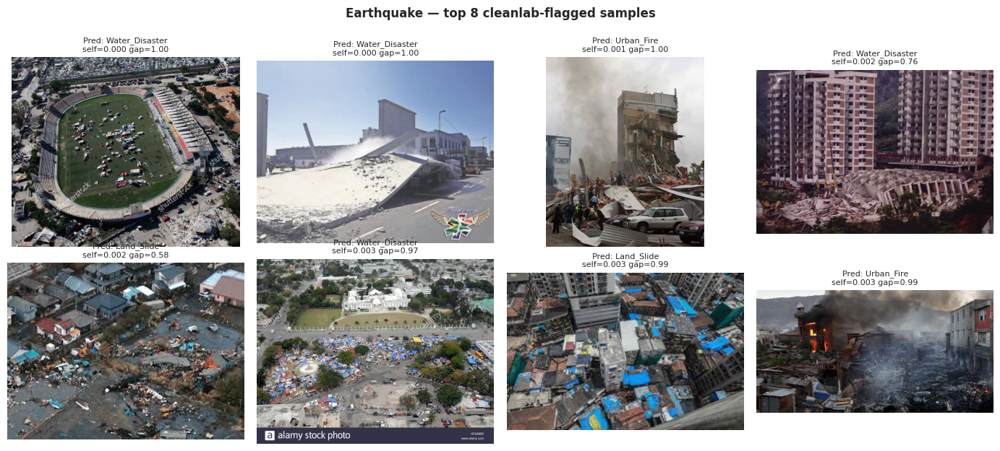

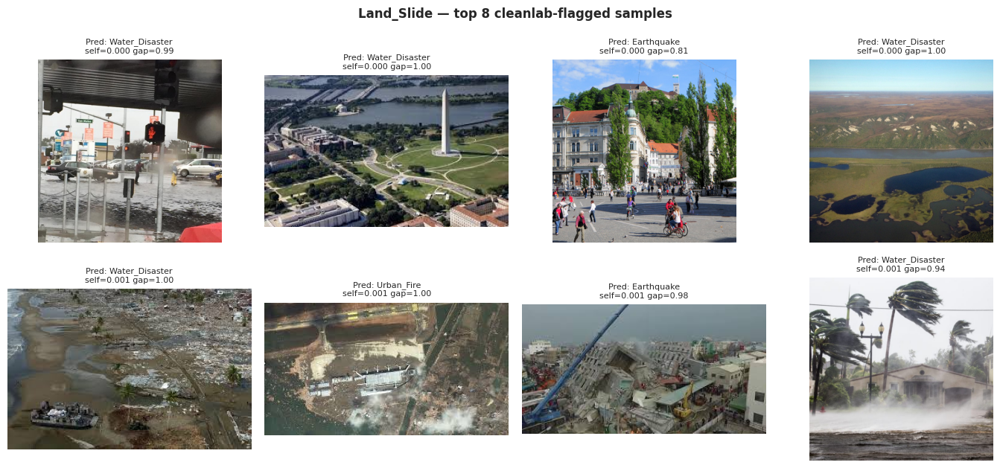

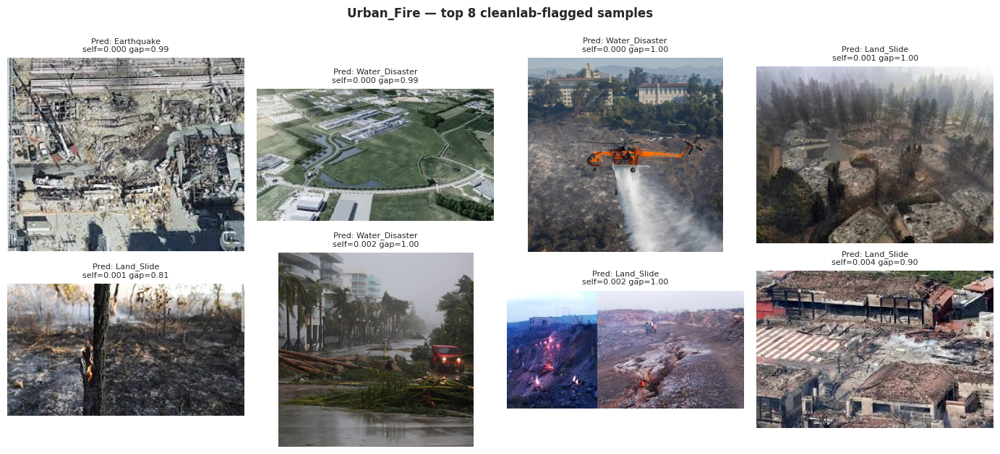

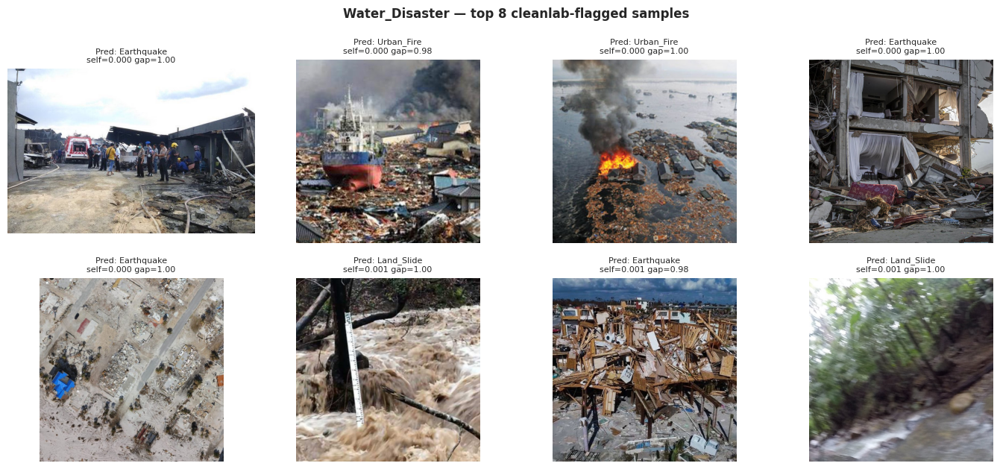

In [19]:
def visualize_suspects_per_class(suspect_df, cls_name, n=12):
    """Show top suspects for one class — manual inspection helper."""
    cls_suspects = suspect_df[suspect_df.given_label == cls_name].head(n)
    if len(cls_suspects) == 0:
        print(f'No suspects for {cls_name}'); return
    cols = 4
    rows = (len(cls_suspects) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(14, 3.2 * rows))
    axes = axes.flat if rows > 1 else axes
    for ax, (_, r) in zip(axes, cls_suspects.iterrows()):
        img = cv2.cvtColor(cv2.imread(r['path']), cv2.COLOR_BGR2RGB)
        ax.imshow(img); ax.axis('off')
        ax.set_title(f"Pred: {r['model_pred']}\nself={r['self_conf']:.3f} gap={r['gap']:.2f}",
                     fontsize=8)
    for ax in list(axes)[len(cls_suspects):]:
        ax.axis('off')
    plt.suptitle(f'{cls_name} — top {n} cleanlab-flagged samples',
                 fontsize=12, fontweight='bold')
    plt.tight_layout(); plt.show()

for c in CLASSES:
    visualize_suspects_per_class(suspect_df, c, n=8)


In [20]:
STRICT_SELF_CONF = 0.01
STRICT_PRED_CONF = 0.90
STRICT_GAP       = 0.85

strict_mask = (
    (suspect_df['self_conf'] < STRICT_SELF_CONF) &
    (suspect_df['pred_conf'] > STRICT_PRED_CONF) &
    (suspect_df['gap']       > STRICT_GAP)
)
drop_idx = suspect_df.loc[strict_mask, 'idx'].values

print(f'Strict mislabel candidates: {len(drop_idx)} '
      f'(self_conf<{STRICT_SELF_CONF}, pred_conf>{STRICT_PRED_CONF}, gap>{STRICT_GAP})')

if len(drop_idx) > 0:
    print('\nFiles to drop:')
    print(suspect_df.loc[strict_mask, ['file','given_label','model_pred','self_conf','pred_conf']]
          .to_string(index=False))
    df_all = df_all.drop(df_all.index[drop_idx]).reset_index(drop=True)
    print(f'\nDropped {len(drop_idx)} -> {len(df_all)} files remaining')
else:
    print('No strict mislabels — dataset clean.')

print('\nFinal class distribution:')
print(df_all.label.value_counts().reindex(CLASSES))

del feat_extractor, features, audit_ds
gc.collect()


Strict mislabel candidates: 47 (self_conf<0.01, pred_conf>0.9, gap>0.85)

Files to drop:
          file    given_label     model_pred  self_conf  pred_conf
04_01_0338.png     Land_Slide Water_Disaster   0.000008   0.991482
   03_0575.png Water_Disaster     Earthquake   0.000016   0.996216
   03_0867.png Water_Disaster     Urban_Fire   0.000017   0.975321
   03_0291.png Water_Disaster     Urban_Fire   0.000034   0.999426
   03_0068.png Water_Disaster     Earthquake   0.000053   0.999896
        16.jpg     Earthquake Water_Disaster   0.000080   0.999373
       388.jpg     Earthquake Water_Disaster   0.000100   0.996743
04_01_0183.png     Land_Slide Water_Disaster   0.000102   0.998758
01_01_0023.png     Urban_Fire     Earthquake   0.000131   0.990935
01_01_0065.png     Urban_Fire Water_Disaster   0.000145   0.993939
01_01_0076.png     Urban_Fire Water_Disaster   0.000362   0.996320
   03_0617.png Water_Disaster     Earthquake   0.000404   0.999202
04_01_0279.png     Land_Slide Water_Disa

47898

**Interpretasi.** Pendekatan konservatif: hanya drop sampel yang model **sangat yakin** label-nya salah (gap >0.85). Hard examples — terutama Land_Slide yang ambigu dengan Water_Disaster / Earthquake — sengaja **tidak dibuang** karena justru penting untuk training. Untuk manual review lebih lanjut, panggil `visualize_suspects_per_class(suspect_df, 'Land_Slide', n=20)`.

### 3.4 Dataset Preparation


In [21]:
df_processed = df_all.copy()
df_processed["label_idx"] = df_processed.label.map(CLS2IDX)

print(f"Distribusi final ({len(df_processed)} images):")
print(df_processed.label.value_counts().reindex(CLASSES))


Distribusi final (2176 images):
label
Earthquake        417
Land_Slide        379
Urban_Fire        388
Water_Disaster    992
Name: count, dtype: int64


### 3.5 Stratified K-Fold Split

Test holdout (15%) diambil lebih dahulu, lalu `StratifiedKFold(k=5)` diterapkan pada sisa data. Tidak ada oversampling — imbalance ditangani via focal loss + class weights.

In [22]:
df_trainval, test_df = train_test_split(
    df_processed, test_size=cfg.TEST_SPLIT,
    stratify=df_processed.label_idx, random_state=cfg.SEED
)
df_trainval = df_trainval.reset_index(drop=True)
test_df     = test_df.reset_index(drop=True)

skf   = StratifiedKFold(n_splits=cfg.N_FOLDS, shuffle=True, random_state=cfg.SEED)
folds = list(skf.split(df_trainval, df_trainval.label_idx))

print(f"Test holdout : {len(test_df):4d} images")
print(f"Train+Val    : {len(df_trainval):4d} images | {cfg.N_FOLDS} folds\n")
for k, (tr_idx, vl_idx) in enumerate(folds):
    tr = df_trainval.iloc[tr_idx].label.value_counts().reindex(CLASSES)
    vl = df_trainval.iloc[vl_idx].label.value_counts().reindex(CLASSES)
    print(f"Fold {k}: train={len(tr_idx):4d}  val={len(vl_idx):4d}  "
          f"| {tr.values.tolist()} | {vl.values.tolist()}")

Test holdout :  327 images
Train+Val    : 1849 images | 5 folds

Fold 0: train=1479  val= 370  | [283, 258, 264, 674] | [71, 64, 66, 169]
Fold 1: train=1479  val= 370  | [283, 258, 264, 674] | [71, 64, 66, 169]
Fold 2: train=1479  val= 370  | [283, 258, 264, 674] | [71, 64, 66, 169]
Fold 3: train=1479  val= 370  | [283, 257, 264, 675] | [71, 65, 66, 168]
Fold 4: train=1480  val= 369  | [284, 257, 264, 675] | [70, 65, 66, 168]


In [23]:
FOLD     = 0
tr_idx, vl_idx = folds[FOLD]
train_df = df_trainval.iloc[tr_idx].reset_index(drop=True)
val_df   = df_trainval.iloc[vl_idx].reset_index(drop=True)

wd_mask = train_df.label == "Water_Disaster"
if wd_mask.sum() > cfg.WATER_TRAIN_CAP:
    wd_keep  = train_df[wd_mask].sample(n=cfg.WATER_TRAIN_CAP, random_state=cfg.SEED)
    train_df = pd.concat([train_df[~wd_mask], wd_keep], ignore_index=True)\
                 .sample(frac=1, random_state=cfg.SEED).reset_index(drop=True)
ls_mask = train_df.label == "Land_Slide"
if ls_mask.sum() < cfg.LS_TRAIN_TARGET:
    n_extra = cfg.LS_TRAIN_TARGET - ls_mask.sum()
    extra   = train_df[ls_mask].sample(n=n_extra, replace=True, random_state=cfg.SEED)
    train_df = pd.concat([train_df, extra], ignore_index=True)\
                 .sample(frac=1, random_state=cfg.SEED).reset_index(drop=True)


print(f"Active fold: {FOLD}")
print(f"Train: {len(train_df)}  Val: {len(val_df)}  Test: {len(test_df)}")
print("\nTrain distribution:")
print(train_df.label.value_counts().reindex(CLASSES))
print("\nVal distribution:")
print(val_df.label.value_counts().reindex(CLASSES))

Active fold: 0
Train: 1647  Val: 370  Test: 327

Train distribution:
label
Earthquake        283
Land_Slide        500
Urban_Fire        264
Water_Disaster    600
Name: count, dtype: int64

Val distribution:
label
Earthquake         71
Land_Slide         64
Urban_Fire         66
Water_Disaster    169
Name: count, dtype: int64


### 3.6 Data Pipeline (tf.data)

Augmentasi disesuaikan dengan hasil EDA:
- **Input size**: 288 px (naik dari 224) — detail texture lebih tajam untuk Earthquake vs Land_Slide
- **RandomResizedCrop** scale 0.75-1.0, **HorizontalFlip**, **VerticalFlip**
- **Brightness** +-0.25, **Contrast** 0.8-1.2, **Saturation** 0.8-1.2
- **Hue** +-0.03 (sangat ringan — jaga signature merah Urban_Fire: mean_s=98 vs ~52)
- **Mixup** (alpha=0.4) + **CutMix** (alpha=1.0) di level batch — memaksa model belajar fitur
  diskriminatif, bukan memorisasi. Efektif untuk Earthquake ↔ Land_Slide confusion.

**Imbalance handling** (IR=2.48): Focal loss gamma=2 + alpha=class_weights
(class_weight di `.fit()` tidak kompatibel dengan soft labels dari Mixup/CutMix).

In [24]:
def preprocess_input(x):
    return x / 255.0


def augment_train(img, img_size):
    h = tf.shape(img)[0]
    w = tf.shape(img)[1]
    scale = tf.random.uniform([], 0.75, 1.0)
    ch = tf.maximum(tf.cast(tf.cast(h, tf.float32) * scale, tf.int32), 1)
    cw = tf.maximum(tf.cast(tf.cast(w, tf.float32) * scale, tf.int32), 1)
    img = tf.image.random_crop(img, [ch, cw, 3])
    img = tf.image.resize(img, [img_size, img_size])
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_flip_up_down(img)
    img = tf.image.random_brightness(img, 0.25 * 255)
    img = tf.image.random_contrast(img, 0.8, 1.2)
    img = tf.image.random_saturation(img, 0.8, 1.2)
    img = tf.image.random_hue(img, 0.03)
    return tf.clip_by_value(img, 0.0, 255.0)


def center_crop_resize(img, img_size):
    resize_to = tf.maximum(
        tf.cast(tf.cast(img_size, tf.float32) * (256.0 / 224.0), tf.int32),
        img_size + 4,
    )
    img = tf.image.resize(img, [resize_to, resize_to])
    off = (resize_to - img_size) // 2
    return tf.image.crop_to_bounding_box(img, off, off, img_size, img_size)


def load_image(path, label, img_size, is_training, raw=False):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=3, expand_animations=False)
    img = tf.cast(img, tf.float32)
    img = augment_train(img, img_size) if is_training else center_crop_resize(img, img_size)
    return (img if raw else preprocess_input(img)), label


def apply_mixup(images, labels, num_classes, alpha=0.3):
    batch_size = tf.shape(images)[0]
    g1 = tf.random.gamma([1], alpha)[0]
    g2 = tf.random.gamma([1], alpha)[0]
    lam = tf.cast(g1 / (g1 + g2 + 1e-8), tf.float32)
    idx = tf.random.shuffle(tf.range(batch_size))
    mixed = lam * images + (1.0 - lam) * tf.gather(images, idx)
    y1 = tf.one_hot(labels, num_classes)
    y2 = tf.one_hot(tf.gather(labels, idx), num_classes)
    return mixed, lam * y1 + (1.0 - lam) * y2


def apply_cutmix(images, labels, num_classes, alpha=0.5):
    batch_size = tf.shape(images)[0]
    img_h = tf.shape(images)[1]
    img_w = tf.shape(images)[2]
    g1 = tf.random.gamma([1], alpha)[0]
    g2 = tf.random.gamma([1], alpha)[0]
    lam = tf.cast(g1 / (g1 + g2 + 1e-8), tf.float32)
    cut_ratio = tf.sqrt(1.0 - lam)
    cut_h = tf.cast(tf.cast(img_h, tf.float32) * cut_ratio, tf.int32)
    cut_w = tf.cast(tf.cast(img_w, tf.float32) * cut_ratio, tf.int32)
    cy = tf.random.uniform([], 0, img_h, dtype=tf.int32)
    cx = tf.random.uniform([], 0, img_w, dtype=tf.int32)
    y1b = tf.clip_by_value(cy - cut_h // 2, 0, img_h)
    y2b = tf.clip_by_value(cy + cut_h // 2, 0, img_h)
    x1b = tf.clip_by_value(cx - cut_w // 2, 0, img_w)
    x2b = tf.clip_by_value(cx + cut_w // 2, 0, img_w)
    row_mask = tf.cast((tf.range(img_h) >= y1b) & (tf.range(img_h) < y2b), tf.float32)
    col_mask = tf.cast((tf.range(img_w) >= x1b) & (tf.range(img_w) < x2b), tf.float32)
    mask = row_mask[:, None] * col_mask[None, :]
    mask = mask[None, :, :, None]
    idx = tf.random.shuffle(tf.range(batch_size))
    mixed = images * (1.0 - mask) + tf.gather(images, idx) * mask
    actual_lam = 1.0 - tf.cast((y2b - y1b) * (x2b - x1b), tf.float32) / tf.cast(img_h * img_w, tf.float32)
    y1_oh = tf.one_hot(labels, num_classes)
    y2_oh = tf.one_hot(tf.gather(labels, idx), num_classes)
    return mixed, actual_lam * y1_oh + (1.0 - actual_lam) * y2_oh


def mixup_or_cutmix(images, labels, num_classes=4, p_mix=0.3, p_cut=0.5):
    r = tf.random.uniform([])
    return tf.cond(
        r < p_mix,
        lambda: apply_mixup(images, labels, num_classes),
        lambda: tf.cond(
            r < p_mix + p_cut,
            lambda: apply_cutmix(images, labels, num_classes),
            lambda: (images, tf.cast(tf.one_hot(labels, num_classes), tf.float32)),
        ),
    )


def make_dataset(df, img_size, batch_size, *,
                 is_training=False, flip=None, raw=False, shuffle_buf=2000):
    ds = tf.data.Dataset.from_tensor_slices(
        (df['path'].values, df['label_idx'].values.astype(np.int32))
    )
    if is_training:
        ds = ds.shuffle(shuffle_buf, seed=cfg.SEED, reshuffle_each_iteration=True)
    ds = ds.map(lambda p, l: load_image(p, l, img_size, is_training, raw=raw),
                num_parallel_calls=tf.data.AUTOTUNE)
    if flip == 'h':
        ds = ds.map(lambda x, l: (tf.image.flip_left_right(x), l),
                    num_parallel_calls=tf.data.AUTOTUNE)
    elif flip == 'v':
        ds = ds.map(lambda x, l: (tf.image.flip_up_down(x), l),
                    num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(batch_size)
    if is_training:
        ds = ds.map(lambda x, y: mixup_or_cutmix(x, y, num_classes=cfg.NUM_CLASSES),
                    num_parallel_calls=tf.data.AUTOTUNE)
    return ds.prefetch(tf.data.AUTOTUNE)


print('Data pipeline ready.')


Data pipeline ready.


## 4. Model Architecture

Dua model dengan strategi berbeda, keduanya < 10M params:

| Model | Arsitektur | Params (approx) | Strategi |
|---|---|---|---|
| **EfficientNetB2** | Pretrained ImageNet, top-30 layers unfrozen | ~9.1M | Fine-tuning — feature extractor kuat untuk kelas ambiguous (EQ ↔ LS) |
| **SimpleConvNet** | VGG-style conv blocks, GAP | ~4.2M | From scratch — baseline stabil, gradien mengalir baik |

EfficientNetB2 menerima input `[0,255]` (internal Rescaling). SimpleConvNet menerima `[0,1]` (manual normalisasi). Dua pipeline data terpisah digunakan sesuai format input masing-masing.

### 4.1 Model 1 — EfficientNetB2 (pretrained ImageNet, ~9.1M params)

Pre-trained on ImageNet, fine-tuned untuk disaster classification. Top-30 layers di-unfreeze; early feature extractor di-freeze untuk mencegah catastrophic forgetting. Input: `[0, 255]` float32 — EfficientNet memiliki internal Rescaling layer.

In [25]:
def build_efficientnet(num_classes=4, input_shape=(288, 288, 3)):
    """EfficientNetB2 fine-tuned from ImageNet weights.
    Input: [0,255] float32 (built-in Rescaling layer handles normalization).
    Trainable params: ~9.1M < 10M limit.
    Strategy: freeze early layers, fine-tune top-30 + classification head."""
    base = keras.applications.EfficientNetB2(
        include_top=False,
        weights="imagenet",
        input_shape=input_shape,
        pooling="avg",
    )
    base.trainable = True
    for layer in base.layers[:-30]:
        layer.trainable = False

    inp = base.input
    x   = base.output
    x   = layers.Dropout(0.3)(x)
    out = layers.Dense(num_classes, activation="softmax",
                       kernel_regularizer=keras.regularizers.l2(1e-4))(x)
    model = keras.Model(inp, out, name="EfficientNetB2")

    trainable_count = sum(
        tf.size(w).numpy() for w in model.trainable_weights
    )
    total_count = sum(
        tf.size(w).numpy() for w in model.weights
    )
    print(f"EfficientNetB2  total={total_count/1e6:.2f}M  "
          f"trainable={trainable_count/1e6:.2f}M  "
          f"(< 10M requirement: {'OK' if total_count < 10e6 else 'EXCEEDS'})")
    return model


### 4.2 Model 2 — SimpleConvNet (from scratch, ~4.2M params)

Dilatih dari nol tanpa pretrained weights. VGG-style: 5 conv blocks + GAP + Dense(512) + Dense(256) + softmax. Input: `[0, 1]` float32 (normalized).

In [26]:
def build_simple_convnet(num_classes=4, input_shape=(288, 288, 3)):
    """SimpleConvNet: VGG-style, from scratch, ~4.2M params.
    5 conv blocks -> GAP -> Dense(512) -> Dense(256) -> softmax. L2 reg."""
    reg = keras.regularizers.l2(1e-4)

    def conv_block(x, filters, n_conv=2):
        for _ in range(n_conv):
            x = layers.Conv2D(filters, 3, padding="same",
                              use_bias=False, kernel_regularizer=reg)(x)
            x = layers.BatchNormalization()(x)
            x = layers.ReLU()(x)
        return layers.MaxPooling2D(2)(x)

    inp = keras.Input(shape=input_shape)
    x = conv_block(inp, 32,  n_conv=2)
    x = conv_block(x,   64,  n_conv=2)
    x = conv_block(x,   128, n_conv=2)
    x = conv_block(x,   256, n_conv=2)
    x = conv_block(x,   256, n_conv=2)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(512, activation="relu")(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation="relu")(x)
    x = layers.Dropout(0.5)(x)
    out = layers.Dense(num_classes, activation="softmax")(x)
    return keras.Model(inp, out, name="SimpleConvNet")


### 4.3 Focal Loss & Macro-F1 Callback

In [27]:
class FocalLoss(keras.losses.Loss):
    """Focal Loss with label smoothing. Supports both integer and soft (Mixup/CutMix) labels."""
    def __init__(self, gamma=2.0, alpha=None, label_smoothing=0.0, **kwargs):
        super().__init__(**kwargs)
        self.gamma = float(gamma)
        self.alpha = np.array(alpha, dtype=np.float32) if alpha is not None else None
        self.label_smoothing = float(label_smoothing)

    def call(self, y_true, y_pred):
        y_pred   = tf.clip_by_value(tf.cast(y_pred, tf.float32), 1e-7, 1.0)
        n        = tf.shape(y_pred)[-1]
        y_true_f = tf.cast(y_true, tf.float32)
        if y_true_f.shape.ndims == 1:
            y_oh = tf.one_hot(tf.cast(y_true_f, tf.int32), n)
        else:
            y_oh = y_true_f
        if self.label_smoothing > 0:
            y_oh = y_oh * (1.0 - self.label_smoothing) + self.label_smoothing / tf.cast(n, tf.float32)
        p_t  = tf.reduce_sum(y_oh * y_pred, axis=-1)
        loss = -tf.pow(1.0 - p_t, self.gamma) * tf.math.log(p_t)
        if self.alpha is not None:
            alpha_t = tf.reduce_sum(y_oh * tf.cast(self.alpha, tf.float32), axis=-1)
            loss    = loss * alpha_t
        return loss

    def get_config(self):
        c = super().get_config()
        c.update({"gamma": self.gamma, "label_smoothing": self.label_smoothing,
                  "alpha": self.alpha.tolist() if self.alpha is not None else None})
        return c


class LinearWarmup(keras.callbacks.Callback):
    """Linearly ramp LR from ~0 to base_lr over warmup_epochs."""
    def __init__(self, base_lr, warmup_epochs=5):
        super().__init__()
        self.base_lr = base_lr
        self.warmup  = warmup_epochs

    def on_epoch_begin(self, epoch, logs=None):
        if epoch < self.warmup:
            lr = self.base_lr * (epoch + 1) / self.warmup
            self.model.optimizer.learning_rate = lr


class MacroF1Callback(keras.callbacks.Callback):
    """Compute val macro-F1 each epoch and expose it for EarlyStopping."""
    def __init__(self, val_ds, metric_name="val_macro_f1", verbose=True):
        super().__init__()
        self._val_ds  = val_ds
        self._name    = metric_name
        self._verbose = verbose

    def on_epoch_end(self, epoch, logs=None):
        y_true, y_pred = [], []
        for xb, yb in self._val_ds:
            y_pred.extend(tf.argmax(self.model(xb, training=False), 1).numpy())
            y_true.extend(yb.numpy())
        f1 = f1_score(y_true, y_pred, average="macro", zero_division=0)
        logs[self._name] = float(f1)
        if self._verbose:
            _, rec, _, _ = precision_recall_fscore_support(
                y_true, y_pred, labels=np.arange(cfg.NUM_CLASSES), zero_division=0)
            rec_str = "  ".join(f"{CLASSES[i]}={rec[i]:.3f}" for i in range(cfg.NUM_CLASSES))
            print(f"  val_macro_f1={f1:.4f}  recall: {rec_str}")


print("FocalLoss, LinearWarmup, MacroF1Callback ready.")


FocalLoss, LinearWarmup, MacroF1Callback ready.


## 5. Training (Fold 0)

In [28]:
raw_w = compute_class_weight('balanced',
                              classes=np.arange(cfg.NUM_CLASSES),
                              y=train_df['label_idx'].values)
class_weight_dict = {i: float(raw_w[i]) for i in range(cfg.NUM_CLASSES)}

raw_w[CLS2IDX['Land_Slide']] *= 1.8
focal_loss = FocalLoss(gamma=2.0, alpha=raw_w.tolist(), label_smoothing=0.05)

print('Class weights (encoded as focal alpha):')
print({CLASSES[k]: round(v, 4) for k, v in class_weight_dict.items()})

IMG, B, EB = cfg.IMG_SIZE, cfg.BATCH, cfg.EVAL_BATCH

train_ds      = make_dataset(train_df, IMG, B,  is_training=True)
val_ds        = make_dataset(val_df,   IMG, EB)
val_ds_flip   = make_dataset(val_df,   IMG, EB, flip='h')
val_ds_vflip  = make_dataset(val_df,   IMG, EB, flip='v')
test_ds       = make_dataset(test_df,  IMG, EB)
test_ds_flip  = make_dataset(test_df,  IMG, EB, flip='h')
test_ds_vflip = make_dataset(test_df,  IMG, EB, flip='v')
print('Datasets ready.')

effnet_train_ds      = make_dataset(train_df, IMG, B,  is_training=True, raw=True)
effnet_val_ds        = make_dataset(val_df,   IMG, 32, raw=True)
effnet_val_ds_flip   = make_dataset(val_df,   IMG, 32, raw=True, flip='h')
effnet_val_ds_vflip  = make_dataset(val_df,   IMG, 32, raw=True, flip='v')
effnet_test_ds       = make_dataset(test_df,  IMG, 32, raw=True)
effnet_test_ds_flip  = make_dataset(test_df,  IMG, 32, raw=True, flip='h')
effnet_test_ds_vflip = make_dataset(test_df,  IMG, 32, raw=True, flip='v')
print('EfficientNet datasets ready.')


Class weights (encoded as focal alpha):
{'Earthquake': 1.4549, 'Land_Slide': 0.8235, 'Urban_Fire': 1.5597, 'Water_Disaster': 0.6863}
Datasets ready.
EfficientNet datasets ready.


In [29]:
def plot_curves(hist, title):
    fig, ax = plt.subplots(1, 2, figsize=(14, 4))
    fig.suptitle(f"{title} - Training Curves")
    ax[0].plot(hist.history["loss"],     label="Train")
    ax[0].plot(hist.history["val_loss"], label="Val", ls="--")
    ax[0].set(title="Loss", xlabel="Epoch", ylabel="Loss"); ax[0].legend()
    ax[1].plot(hist.history["val_macro_f1"], label="Val macro-F1", color="green")
    if "learning_rate" in hist.history:
        ax2 = ax[1].twinx()
        ax2.plot(hist.history["learning_rate"], label="LR", color="gray", ls=":")
        ax2.set_ylabel("LR"); ax2.legend(loc="lower right")
    ax[1].set(title="Val macro-F1", xlabel="Epoch", ylabel="F1", ylim=(0, 1.05))
    ax[1].legend(loc="upper left")
    plt.tight_layout()
    plt.savefig(cfg.OUTPUT_DIR + f"{title}_curves.png", dpi=120)
    plt.show()


def get_labels(ds):
    return np.concatenate([y.numpy() for _, y in ds])


def tta_probs(model, ds_normal, ds_hflip, ds_vflip=None):
    """TTA: average normal + hflip + (optional) vflip predictions."""
    p = model.predict(ds_normal, verbose=0) + model.predict(ds_hflip, verbose=0)
    if ds_vflip is not None:
        p += model.predict(ds_vflip, verbose=0)
        return p / 3
    return p / 2


def make_callbacks(name, base_lr=1e-4, warmup=5, val_dataset=None):
    _vds = val_dataset if val_dataset is not None else val_ds
    return [
        LinearWarmup(base_lr, warmup_epochs=warmup),
        MacroF1Callback(_vds),
        callbacks.EarlyStopping(monitor="val_macro_f1", mode="max",
                                patience=cfg.PATIENCE, restore_best_weights=True),
        callbacks.ReduceLROnPlateau(monitor="val_macro_f1", mode="max",
                                   factor=0.5, patience=3, min_lr=1e-7, verbose=0),
        callbacks.ModelCheckpoint(str(ART_DIR / f"best_{name}.keras"),
                                  monitor="val_macro_f1", mode="max",
                                  save_best_only=True, verbose=0),
    ]


print("Helper functions ready.")

Helper functions ready.


### 5.0 Hyperparameter Tuning (Grid Search)

Metode: **2-D grid search** — `gamma` × `ls_boost`, 8 kombinasi.
Hanya SimpleConvNet yang dilatih tiap trial (lebih cepat, ~25 menit total).
Objective: val macro-F1.  Best params lalu dipakai untuk training final kedua model.

| Parameter | Range | Justifikasi |
|---|---|---|
| `gamma` | {2.0, 2.5} | Focal loss exponent — kontrol fokus ke hard examples |
| `ls_boost` | {1.5, 2.0, 2.5, 3.0} | Land_Slide alpha multiplier — paling impactful untuk kelas paling sulit |

Grid search: 8 combos x SimpleConvNet (proxy) x max 20 epochs
 gamma  ls_boost  val_macro_f1  val_LS_f1
---------------------------------------------


2026-05-21 12:58:26.228184: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 12:58:26.423911: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 12:58:27.385643: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 12:58:27.558184: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 12:58:29.836775: E external/local_xla/xla/stream_

   2.0       1.5        0.7624     0.6496
   2.0       2.0        0.7494     0.6179
   2.0       2.5        0.7167     0.6082
   2.0       3.0        0.7421     0.6277
   2.5       1.5        0.7377     0.6500
   2.5       2.0        0.7542     0.6713
   2.5       2.5        0.7550     0.6452
   2.5       3.0        0.7178     0.5843

Grid search results (sorted by val macro-F1):
 gamma  ls_boost   val_f1  val_ls_f1
   2.0       1.5 0.762426   0.649573
   2.5       2.5 0.755006   0.645161
   2.5       2.0 0.754205   0.671329
   2.0       2.0 0.749364   0.617886
   2.0       3.0 0.742089   0.627737
   2.5       1.5 0.737669   0.650000
   2.5       3.0 0.717782   0.584270
   2.0       2.5 0.716694   0.608187


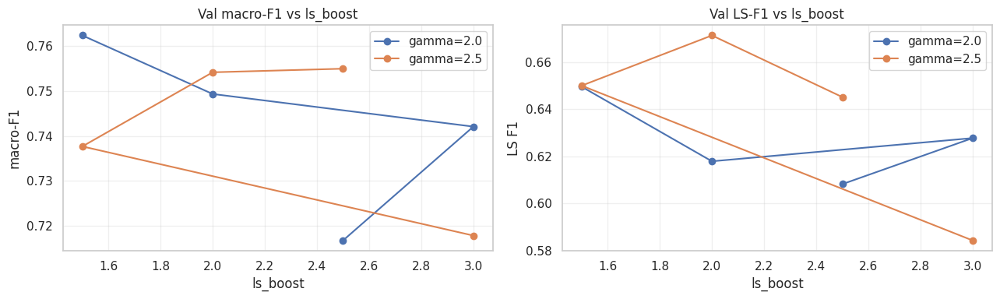


Best params: gamma=2.0  ls_boost=1.5  val_macro_f1=0.7624  val_LS_f1=0.6496


In [30]:
y_val = get_labels(val_ds)

SEARCH_EPOCHS = 20   # max per trial; EarlyStopping cuts further

search_gamma    = [2.0, 2.5]
search_ls_boost = [1.5, 2.0, 2.5, 3.0]

def make_search_cbs(base_lr):
    return [
        LinearWarmup(base_lr, warmup_epochs=3),
        MacroF1Callback(val_ds, verbose=False),
        callbacks.EarlyStopping(monitor="val_macro_f1", mode="max",
                                patience=5, restore_best_weights=True),
        callbacks.ReduceLROnPlateau(monitor="val_macro_f1", mode="max",
                                   factor=0.5, patience=2, min_lr=1e-7, verbose=0),
    ]

grid_results = []
total_combos = len(search_gamma) * len(search_ls_boost)
print(f"Grid search: {total_combos} combos x SimpleConvNet (proxy) x max {SEARCH_EPOCHS} epochs")
print(f"{'gamma':>6}  {'ls_boost':>8}  {'val_macro_f1':>12}  {'val_LS_f1':>9}")
print("-" * 45)

for g in search_gamma:
    for lb in search_ls_boost:
        seed_everything(cfg.SEED)

        rw = compute_class_weight("balanced",
                                  classes=np.arange(cfg.NUM_CLASSES),
                                  y=train_df["label_idx"].values)
        rw[CLS2IDX["Land_Slide"]] *= lb
        tfl = FocalLoss(gamma=g, alpha=rw.tolist(), label_smoothing=0.05)

        m = build_simple_convnet(cfg.NUM_CLASSES, (cfg.IMG_SIZE, cfg.IMG_SIZE, 3))
        m.compile(optimizer=keras.optimizers.Adam(learning_rate=2e-4), loss=tfl)
        m.fit(train_ds, validation_data=val_ds, epochs=SEARCH_EPOCHS,
              callbacks=make_search_cbs(2e-4), verbose=0)

        p = m.predict(val_ds, verbose=0)
        f1_all  = f1_score(y_val, p.argmax(1), average="macro")
        f1_ls   = f1_score(y_val, p.argmax(1), average=None, zero_division=0)[CLS2IDX["Land_Slide"]]
        grid_results.append({"gamma": g, "ls_boost": lb, "val_f1": f1_all, "val_ls_f1": f1_ls})
        print(f"{g:>6.1f}  {lb:>8.1f}  {f1_all:>12.4f}  {f1_ls:>9.4f}")
        del m; gc.collect()

gdf = pd.DataFrame(grid_results).sort_values("val_f1", ascending=False)
print("\nGrid search results (sorted by val macro-F1):")
print(gdf.to_string(index=False))

fig, axes = plt.subplots(1, 2, figsize=(13, 4))
for g, grp in gdf.groupby("gamma"):
    axes[0].plot(grp["ls_boost"], grp["val_f1"],    marker="o", label=f"gamma={g}")
    axes[1].plot(grp["ls_boost"], grp["val_ls_f1"], marker="o", label=f"gamma={g}")
axes[0].set(title="Val macro-F1 vs ls_boost", xlabel="ls_boost", ylabel="macro-F1")
axes[1].set(title="Val LS-F1 vs ls_boost",    xlabel="ls_boost", ylabel="LS F1")
for ax in axes: ax.legend(); ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(cfg.OUTPUT_DIR + "grid_search.png", dpi=120)
plt.show()

best_row    = gdf.iloc[0]
best_params = {
    "gamma"    : float(best_row["gamma"]),
    "ls_boost" : float(best_row["ls_boost"]),
    "lr_effnet": 5e-5,   # EfficientNetB2 fine-tuning (lower LR)
    "lr_simple": 2e-4,   # SimpleConvNet from scratch
}
print(f"\nBest params: gamma={best_params['gamma']:.1f}  ls_boost={best_params['ls_boost']:.1f}  "
      f"val_macro_f1={best_row['val_f1']:.4f}  val_LS_f1={best_row['val_ls_f1']:.4f}")

### 5.1 Train EfficientNetB2 (Fine-tuning)

Fine-tuning dari ImageNet weights dengan LR rendah (`5e-5`). Dataset menggunakan `effnet_train_ds` — gambar dalam range `[0, 255]` tanpa normalisasi manual.

In [31]:
seed_everything(cfg.SEED)
effnet_model = build_efficientnet(cfg.NUM_CLASSES, (cfg.IMG_SIZE, cfg.IMG_SIZE, 3))
effnet_model.summary()

31790344/31790344 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
EfficientNetB2  total=7.77M  trainable=2.98M  (< 10M requirement: OK)


Model: "EfficientNetB2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9       │ (None, 288, 288,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_2         │ (None, 288, 288,  │          0 │ input_layer_9[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_1     │ (None, 288, 288,  │          7 │ rescaling_2[0][0] │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_3         │ (None, 288, 288,  │          0 │ normalization_1[… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 289, 289,  │          0 │ rescaling_3[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 144, 144,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 144, 144,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 144, 144,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 144, 144,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 144, 144,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 144, 144,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 144, 144,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 144, 144,  │        512 │ block1a_se_excit

 Total params: 7,774,205 (29.66 MB)

 Trainable params: 2,977,808 (11.36 MB)

 Non-trainable params: 4,796,397 (18.30 MB)

In [32]:
effnet_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=best_params["lr_effnet"]),
    loss=focal_loss
)

print(f"Training EfficientNetB2 — max {cfg.EPOCHS} epochs (fine-tuning pretrained ImageNet)...")
print(f"  LR={best_params['lr_effnet']:.1e}  gamma={best_params['gamma']:.1f}  "
      f"ls_boost={best_params['ls_boost']:.1f}")
hist_effnet = effnet_model.fit(
    effnet_train_ds, validation_data=effnet_val_ds,
    epochs=cfg.EPOCHS,
    callbacks=make_callbacks("efficientnet_b2", base_lr=best_params["lr_effnet"],
                             val_dataset=effnet_val_ds)
)
print(f"Early stop at epoch {len(hist_effnet.history['loss'])}")

Training EfficientNetB2 — max 50 epochs (fine-tuning pretrained ImageNet)...
  LR=5.0e-05  gamma=2.0  ls_boost=1.5
Epoch 1/50


2026-05-21 13:53:49.799293: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 13:53:49.951629: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 13:53:50.470851: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 13:53:50.616712: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 13:53:51.444552: E external/local_xla/xla/stream_

51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.9934

2026-05-21 13:54:27.477891: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 13:54:27.621093: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 13:54:27.965103: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 13:54:28.111033: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 13:54:28.934613: E external/local_xla/xla/stream_

52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 685ms/step - loss: 0.9928

2026-05-21 13:55:04.111313: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 13:55:04.255495: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 13:55:04.607961: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 13:55:04.754198: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 13:55:05.588769: E external/local_xla/xla/stream_

  val_macro_f1=0.4280  recall: Earthquake=0.310  Land_Slide=0.453  Urban_Fire=0.697  Water_Disaster=0.325
52/52 ━━━━━━━━━━━━━━━━━━━━ 121s 1s/step - loss: 0.9922 - val_loss: 0.7808 - val_macro_f1: 0.4280 - learning_rate: 1.0000e-05
Epoch 2/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.8598  val_macro_f1=0.5773  recall: Earthquake=0.451  Land_Slide=0.688  Urban_Fire=0.833  Water_Disaster=0.444
52/52 ━━━━━━━━━━━━━━━━━━━━ 17s 323ms/step - loss: 0.8593 - val_loss: 0.6003 - val_macro_f1: 0.5773 - learning_rate: 2.0000e-05
Epoch 3/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.7389  val_macro_f1=0.6875  recall: Earthquake=0.620  Land_Slide=0.766  Urban_Fire=0.894  Water_Disaster=0.592
52/52 ━━━━━━━━━━━━━━━━━━━━ 16s 303ms/step - loss: 0.7383 - val_loss: 0.4470 - val_macro_f1: 0.6875 - learning_rate: 3.0000e-05
Epoch 4/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.5956  val_macro_f1=0.7582  recall: Earthquake=0.732  Land_Slide=0.812  Urban_Fire=0.909  Water_Disaster=0.686

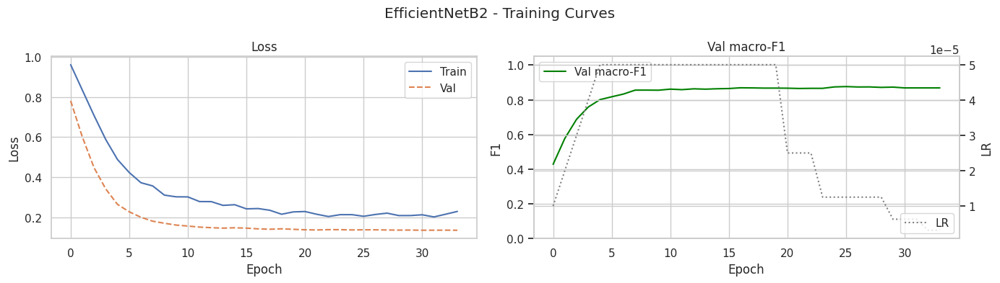

EfficientNetB2  val F1 : 0.8868


In [33]:
plot_curves(hist_effnet, "EfficientNetB2")

val_probs_effnet = tta_probs(effnet_model, effnet_val_ds, effnet_val_ds_flip, effnet_val_ds_vflip)
np.save(ART_DIR / "val_probs_effnet.npy", val_probs_effnet)

print(f"EfficientNetB2  val F1 : {f1_score(y_val, val_probs_effnet.argmax(1), average='macro'):.4f}")

### 5.2 Train SimpleConvNet (from scratch)

Dilatih dari nol dengan LR `2e-4`. Dataset menggunakan `train_ds` — gambar normalized `[0,1]`.

In [34]:
seed_everything(cfg.SEED)
simple_model = build_simple_convnet(cfg.NUM_CLASSES, (cfg.IMG_SIZE, cfg.IMG_SIZE, 3))
simple_model.summary()

Model: "SimpleConvNet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)     │ (None, 288, 288, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_80 (Conv2D)              │ (None, 288, 288, 32)   │           864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_80          │ (None, 288, 288, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_80 (ReLU)                 │ (None, 288, 288, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_81 (Conv2D)              │ (None, 288, 288, 32)   │         9,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_81          │ (None, 288, 288, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_81 (ReLU)                 │ (None, 288, 288, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_40 (MaxPooling2D) │ (None, 144, 144, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_82 (Conv2D)              │ (None, 144, 144, 64)   │        18,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_82          │ (None, 144, 144, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_82 (ReLU)                 │ (None, 144, 144, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_83 (Conv2D)              │ (None, 144, 144, 64)   │        36,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_83          │ (None, 144, 144, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_83 (ReLU)                 │ (None, 144, 144, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_41 (MaxPooling2D) │ (None, 72, 72, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_84 (Conv2D)              │ (None, 72, 72, 128)    │        73,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_84          │ (None, 72, 72, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_84 (ReLU)                 │ (None, 72, 72, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_85 (Conv2D)              │ (None, 72, 72, 128)    │       147,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_85          │ (None, 72, 72, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_85 (ReLU)                 │ (None, 72, 72, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_42 (MaxPooling2D) │ (None, 36, 36, 128)    │             

 Total params: 2,620,772 (10.00 MB)

 Trainable params: 2,617,828 (9.99 MB)

 Non-trainable params: 2,944 (11.50 KB)

In [35]:
simple_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=best_params["lr_simple"]),
    loss=focal_loss
)

print(f"Training SimpleConvNet — max {cfg.EPOCHS} epochs (from scratch)...")
hist_simple = simple_model.fit(
    train_ds, validation_data=val_ds,
    epochs=cfg.EPOCHS,
    callbacks=make_callbacks("simple_convnet", base_lr=best_params["lr_simple"])
)
print(f"Early stop at epoch {len(hist_simple.history['loss'])}")

Training SimpleConvNet — max 50 epochs (from scratch)...
Epoch 1/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step - loss: 1.2873  val_macro_f1=0.0757  recall: Earthquake=0.000  Land_Slide=0.000  Urban_Fire=1.000  Water_Disaster=0.000
52/52 ━━━━━━━━━━━━━━━━━━━━ 41s 545ms/step - loss: 1.2844 - val_loss: 1.0521 - val_macro_f1: 0.0757 - learning_rate: 4.0000e-05
Epoch 2/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step - loss: 0.9674  val_macro_f1=0.0757  recall: Earthquake=0.000  Land_Slide=0.000  Urban_Fire=1.000  Water_Disaster=0.000
52/52 ━━━━━━━━━━━━━━━━━━━━ 19s 366ms/step - loss: 0.9666 - val_loss: 1.2767 - val_macro_f1: 0.0757 - learning_rate: 8.0000e-05
Epoch 3/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step - loss: 0.8821  val_macro_f1=0.0757  recall: Earthquake=0.000  Land_Slide=0.000  Urban_Fire=1.000  Water_Disaster=0.000
52/52 ━━━━━━━━━━━━━━━━━━━━ 19s 361ms/step - loss: 0.8815 - val_loss: 1.8112 - val_macro_f1: 0.0757 - learning_rate: 1.2000e-04
Epoch 4/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms

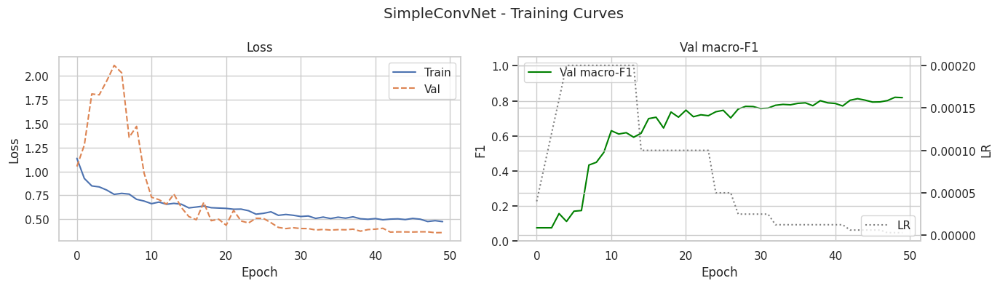

SimpleConvNet  val F1 : 0.8034


In [36]:
plot_curves(hist_simple, "SimpleConvNet")

val_probs_simple = tta_probs(simple_model, val_ds, val_ds_flip, val_ds_vflip)
np.save(ART_DIR / "val_probs_simple_convnet.npy", val_probs_simple)

print(f"SimpleConvNet  val F1 : {f1_score(y_val, val_probs_simple.argmax(1), average='macro'):.4f}")

### 5.3 Per-Model Comparison (Validation)

In [37]:
rows = {}
for name, probs in [("EfficientNetB2", val_probs_effnet), ("SimpleConvNet", val_probs_simple)]:
    pred = probs.argmax(1)
    rows[name] = {
        "accuracy" : accuracy_score(y_val, pred),
        "f1_macro" : f1_score(y_val, pred, average="macro"),
        "bal_acc"  : balanced_accuracy_score(y_val, pred),
    }
pd.DataFrame(rows).T.round(4)


,accuracy,f1_macro,bal_acc
EfficientNetB2,0.9000,0.8868,0.8902
SimpleConvNet,0.8162,0.8034,0.8182


## 6. Ensemble & Threshold Optimization

Bobot w dicari via 1-D grid search (`w ∈ [0.3, 0.7]`, step 0.05) untuk maksimalkan val macro-F1. Range dibatasi agar tidak collapse ke salah satu model. Threshold per-kelas lalu di-tune greedy untuk meningkatkan macro-F1 lebih lanjut.

In [38]:
val_probs_stack = np.stack([val_probs_effnet, val_probs_simple], axis=0)

best_w, best_f1 = 0.0, -1.0
for w in np.arange(0.3, 0.71, 0.05):
    mix = w * val_probs_effnet + (1 - w) * val_probs_simple
    f   = f1_score(y_val, mix.argmax(1), average="macro")
    if f > best_f1:
        best_f1, best_w = f, float(w)

W             = np.array([best_w, 1.0 - best_w])
ens_probs_val = best_w * val_probs_effnet + (1 - best_w) * val_probs_simple

print("Ensemble weights (EfficientNetB2, SimpleConvNet):", W.round(4))
print(f"Ensemble  val acc: {accuracy_score(y_val, ens_probs_val.argmax(1)):.4f}")
print(f"Ensemble  val F1 : {f1_score(y_val, ens_probs_val.argmax(1), average='macro'):.4f}")


Ensemble weights (EfficientNetB2, SimpleConvNet): [0.6 0.4]
Ensemble  val acc: 0.9108
Ensemble  val F1 : 0.8998


In [39]:
def optimize_thresholds(probs, y, grid=np.arange(0.10, 0.91, 0.02)):
    best   = np.ones(cfg.NUM_CLASSES) * 0.5
    best_f = f1_score(y, probs.argmax(1), average="macro")
    improved = True
    while improved:
        improved = False
        for c in range(cfg.NUM_CLASSES):
            for t in grid:
                trial = best.copy(); trial[c] = t
                f = f1_score(y, (probs - trial[None, :]).argmax(1), average="macro")
                if f > best_f + 1e-5:
                    best_f, best[c] = f, t; improved = True
    return best, best_f


THR, f1_thr   = optimize_thresholds(ens_probs_val, y_val)

THR[CLS2IDX["Earthquake"]] = min(float(THR[CLS2IDX["Earthquake"]]), 0.55)
f1_thr      = f1_score(y_val, (ens_probs_val - THR[None, :]).argmax(1), average="macro")
ens_preds_val = (ens_probs_val - THR[None, :]).argmax(1)

print("Per-class thresholds:", dict(zip(CLASSES, THR.round(3))))
print(f"Tuned macro-F1 (val): {f1_thr:.4f}\n")
print(classification_report(y_val, ens_preds_val, target_names=CLASSES, digits=4))

Per-class thresholds: {'Earthquake': np.float64(0.44), 'Land_Slide': np.float64(0.5), 'Urban_Fire': np.float64(0.62), 'Water_Disaster': np.float64(0.5)}
Tuned macro-F1 (val): 0.9146

                precision    recall  f1-score   support

    Earthquake     0.8816    0.9437    0.9116        71
    Land_Slide     0.8169    0.9062    0.8593        64
    Urban_Fire     0.9836    0.9091    0.9449        66
Water_Disaster     0.9630    0.9231    0.9426       169

      accuracy                         0.9216       370
     macro avg     0.9113    0.9205    0.9146       370
  weighted avg     0.9258    0.9216    0.9226       370



In [40]:
meta = {"weights": W.tolist(), "thresholds": THR.tolist(), "classes": CLASSES}
(ART_DIR / "ensemble_meta.json").write_text(json.dumps(meta, indent=2))
print("Ensemble config saved to", ART_DIR / "ensemble_meta.json")


Ensemble config saved to artifacts_models/ensemble_meta.json


## 7. Evaluation


In [41]:
def full_eval(probs, preds, y):
    out = {
        'accuracy'         : accuracy_score(y, preds),
        'f1_macro'         : f1_score(y, preds, average='macro'),
        'balanced_accuracy': balanced_accuracy_score(y, preds),
        'log_loss'         : log_loss(y, np.clip(probs, 1e-7, 1-1e-7),
                                      labels=np.arange(cfg.NUM_CLASSES)),
    }
    try:
        out['roc_auc_ovr'] = roc_auc_score(y, probs, multi_class='ovr', average='macro')
    except Exception:
        out['roc_auc_ovr'] = float('nan')
    return out


def plot_model_eval(probs, y, model_name, split_name,
                    classes=CLASSES, preds=None, save_prefix=''):
    """Classification report, confusion matrix, confidence distribution per model."""
    if preds is None:
        preds = probs.argmax(1)

    print('\n' + '='*62)
    print(f'  {model_name}  |  {split_name} Set')
    print('='*62)
    print(classification_report(y, preds, target_names=classes, digits=4))

    cm  = confusion_matrix(y, preds)
    cmn = cm / cm.sum(axis=1, keepdims=True).clip(min=1)
    fig, ax = plt.subplots(1, 2, figsize=(13, 4.5))
    sns.heatmap(cm,  annot=True, fmt='d',    xticklabels=classes, yticklabels=classes,
                cmap='Blues', ax=ax[0])
    ax[0].set_title(f'{model_name} — {split_name} CM (counts)')
    sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=classes, yticklabels=classes,
                cmap='Blues', ax=ax[1])
    ax[1].set_title(f'{model_name} — {split_name} CM (row-normalized)')
    for a in ax:
        a.set_xlabel('Predicted'); a.set_ylabel('True')
        a.tick_params(axis='x', rotation=25)
    plt.tight_layout()
    if save_prefix:
        plt.savefig(cfg.OUTPUT_DIR + f'{save_prefix}_cm.png', dpi=120)
    plt.show()

    max_probs = probs.max(axis=1)
    correct   = (preds == y)
    fig, axes = plt.subplots(1, 2, figsize=(13, 4))

    axes[0].hist(max_probs[correct],  bins=30, alpha=0.65, color='steelblue',
                 label=f'Correct ({correct.sum()})', density=True)
    axes[0].hist(max_probs[~correct], bins=30, alpha=0.65, color='tomato',
                 label=f'Incorrect ({(~correct).sum()})', density=True)
    axes[0].axvline(max_probs.mean(), color='black', ls='--', lw=1.2,
                    label=f'Mean={max_probs.mean():.3f}')
    axes[0].set_xlabel('Max predicted probability'); axes[0].set_ylabel('Density')
    axes[0].set_title(f'{model_name} — {split_name} Confidence Distribution')
    axes[0].legend(fontsize=9)

    conf_per_class = [probs[y == i, i] for i in range(len(classes))]
    bp = axes[1].boxplot(conf_per_class, labels=classes, patch_artist=True, vert=True)
    for patch, col in zip(bp['boxes'], ['#4C72B0','#DD8452','#55A868','#C44E52']):
        patch.set_facecolor(col); patch.set_alpha(0.7)
    axes[1].set_title(f'{model_name} — {split_name} P(true class) per Class')
    axes[1].set_ylabel('P(true class)'); axes[1].tick_params(axis='x', rotation=25)
    plt.tight_layout()
    if save_prefix:
        plt.savefig(cfg.OUTPUT_DIR + f'{save_prefix}_conf.png', dpi=120)
    plt.show()


### 7.1 Validation Set


#### 7.1.1 EfficientNetB2 — Validation



  EfficientNetB2  |  Validation Set
                precision    recall  f1-score   support

    Earthquake     0.8889    0.9014    0.8951        71
    Land_Slide     0.7612    0.7969    0.7786        64
    Urban_Fire     0.9394    0.9394    0.9394        66
Water_Disaster     0.9455    0.9231    0.9341       169

      accuracy                         0.9000       370
     macro avg     0.8837    0.8902    0.8868       370
  weighted avg     0.9016    0.9000    0.9007       370



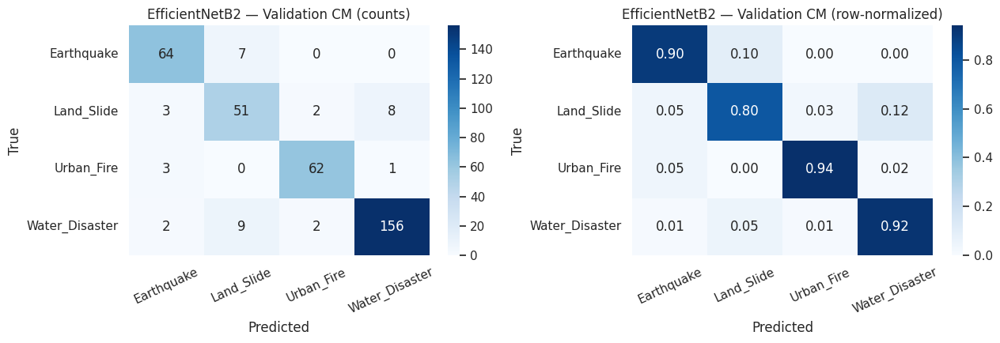

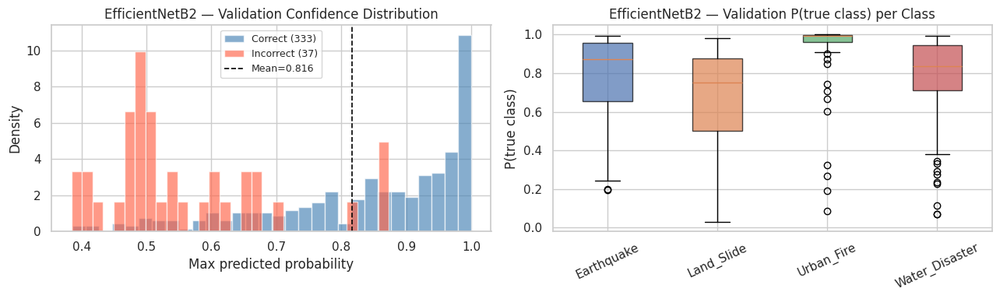

In [42]:
plot_model_eval(val_probs_effnet, y_val, 'EfficientNetB2', 'Validation',
                save_prefix='effnet_val')


#### 7.1.2 SimpleConvNet — Validation



  SimpleConvNet  |  Validation Set
                precision    recall  f1-score   support

    Earthquake     0.8406    0.8169    0.8286        71
    Land_Slide     0.6145    0.7969    0.6939        64
    Urban_Fire     0.8116    0.8485    0.8296        66
Water_Disaster     0.9195    0.8107    0.8616       169

      accuracy                         0.8162       370
     macro avg     0.7965    0.8182    0.8034       370
  weighted avg     0.8323    0.8162    0.8206       370



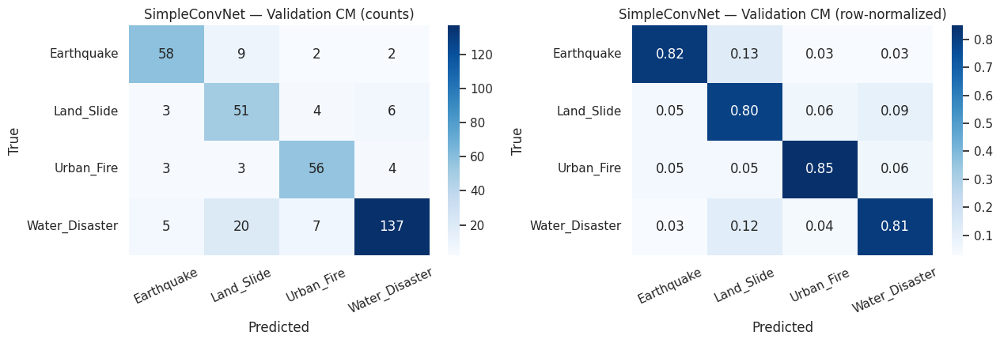

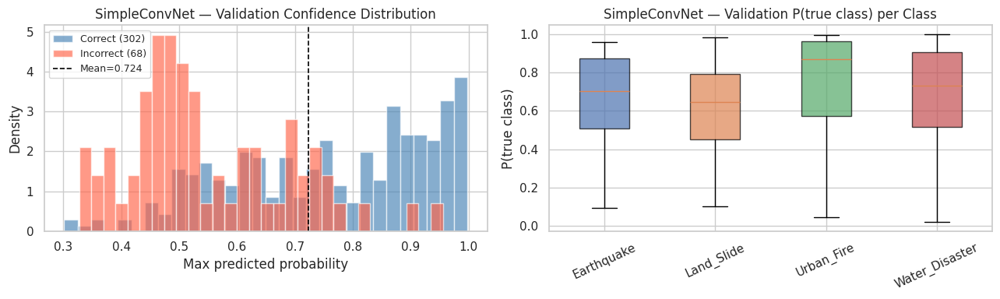

In [43]:
plot_model_eval(val_probs_simple, y_val, 'SimpleConvNet', 'Validation',
                save_prefix='simple_val')


#### 7.1.3 Ensemble — Validation



  Ensemble  |  Validation Set
                precision    recall  f1-score   support

    Earthquake     0.8816    0.9437    0.9116        71
    Land_Slide     0.8169    0.9062    0.8593        64
    Urban_Fire     0.9836    0.9091    0.9449        66
Water_Disaster     0.9630    0.9231    0.9426       169

      accuracy                         0.9216       370
     macro avg     0.9113    0.9205    0.9146       370
  weighted avg     0.9258    0.9216    0.9226       370



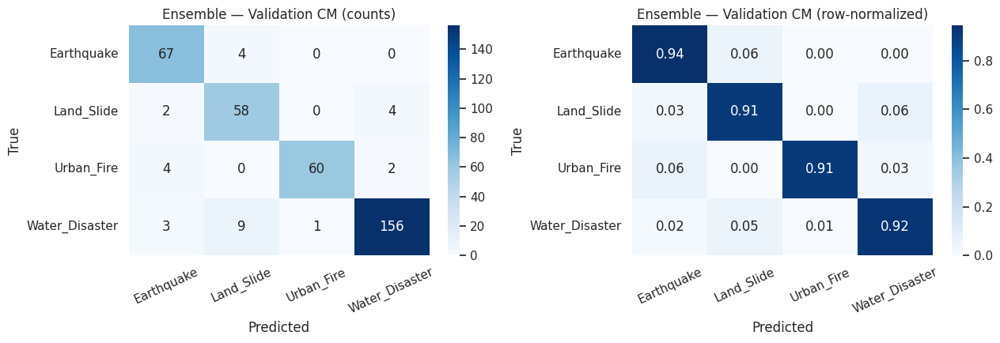

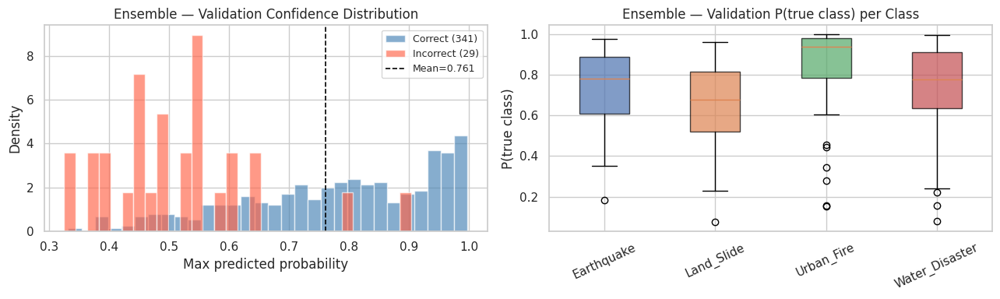

In [44]:
plot_model_eval(ens_probs_val, y_val, 'Ensemble', 'Validation',
                preds=ens_preds_val, save_prefix='ensemble_val')


#### 7.1.4 Recap — Validation


In [45]:
_recap_val = {}
for _name, _probs, _preds in [
    ('EfficientNetB2', val_probs_effnet, val_probs_effnet.argmax(1)),
    ('SimpleConvNet',  val_probs_simple, val_probs_simple.argmax(1)),
    ('Ensemble',       ens_probs_val,    ens_preds_val),
]:
    _recap_val[_name] = {
        'accuracy'    : accuracy_score(y_val, _preds),
        'f1_macro'    : f1_score(y_val, _preds, average='macro'),
        'balanced_acc': balanced_accuracy_score(y_val, _preds),
    }
print('\n=== Validation Recap ===')
print(pd.DataFrame(_recap_val).T.round(4).to_string())



=== Validation Recap ===
                accuracy  f1_macro  balanced_acc
EfficientNetB2    0.9000    0.8868        0.8902
SimpleConvNet     0.8162    0.8034        0.8182
Ensemble          0.9216    0.9146        0.9205


### 7.2 Test Set (Final Evaluation)


In [46]:
y_test = test_df['label_idx'].values

probs_test_effnet = tta_probs(effnet_model,
                              effnet_test_ds, effnet_test_ds_flip, effnet_test_ds_vflip)
probs_test_simple = tta_probs(simple_model,
                              test_ds, test_ds_flip, test_ds_vflip)

test_stack     = np.stack([probs_test_effnet, probs_test_simple], axis=0)
ens_probs_test = (W[:, None, None] * test_stack).sum(0)
ens_preds_test = (ens_probs_test - THR[None, :]).argmax(1)

print('Test probs computed.')
print(f'  EfficientNetB2 test F1 : '
      f'{f1_score(y_test, probs_test_effnet.argmax(1), average="macro"):.4f}')
print(f'  SimpleConvNet  test F1 : '
      f'{f1_score(y_test, probs_test_simple.argmax(1), average="macro"):.4f}')
print(f'  Ensemble       test F1 : '
      f'{f1_score(y_test, ens_preds_test, average="macro"):.4f}')


2026-05-21 14:20:35.604483: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 14:20:35.742719: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 14:20:36.063883: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 14:20:36.210283: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-21 14:20:37.072871: E external/local_xla/xla/stream_

Test probs computed.
  EfficientNetB2 test F1 : 0.9026
  SimpleConvNet  test F1 : 0.8146
  Ensemble       test F1 : 0.8942


#### 7.2.1 EfficientNetB2 — Test



  EfficientNetB2  |  Test Set
                precision    recall  f1-score   support

    Earthquake     0.9344    0.9048    0.9194        63
    Land_Slide     0.8000    0.8421    0.8205        57
    Urban_Fire     0.9811    0.8966    0.9369        58
Water_Disaster     0.9216    0.9463    0.9338       149

      accuracy                         0.9113       327
     macro avg     0.9093    0.8974    0.9026       327
  weighted avg     0.9134    0.9113    0.9118       327



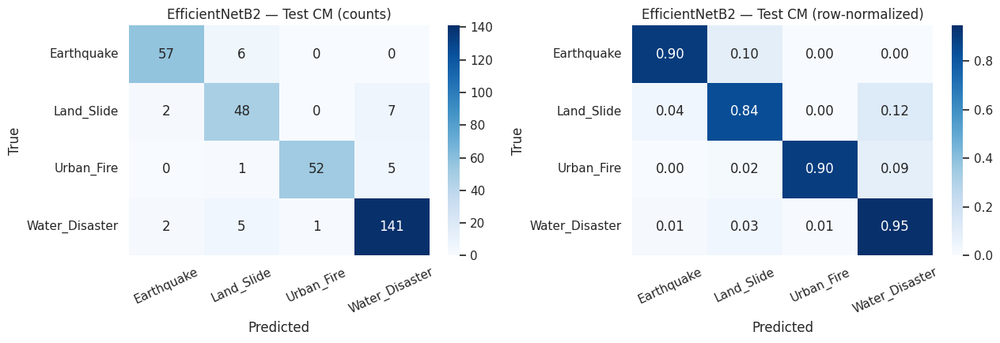

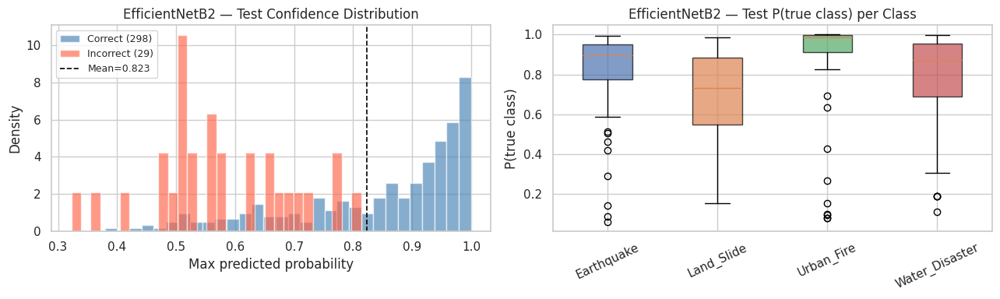

In [47]:
plot_model_eval(probs_test_effnet, y_test, 'EfficientNetB2', 'Test',
                save_prefix='effnet_test')


#### 7.2.2 SimpleConvNet — Test



  SimpleConvNet  |  Test Set
                precision    recall  f1-score   support

    Earthquake     0.8413    0.8413    0.8413        63
    Land_Slide     0.6250    0.7895    0.6977        57
    Urban_Fire     0.8929    0.8621    0.8772        58
Water_Disaster     0.8824    0.8054    0.8421       149

      accuracy                         0.8196       327
     macro avg     0.8104    0.8245    0.8146       327
  weighted avg     0.8314    0.8196    0.8230       327



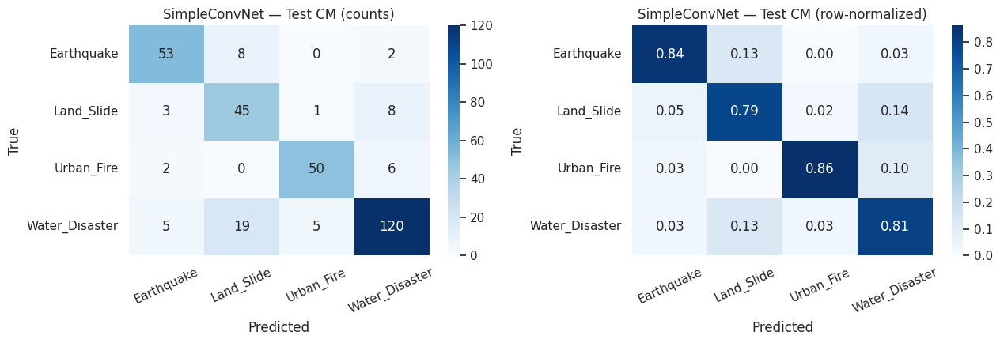

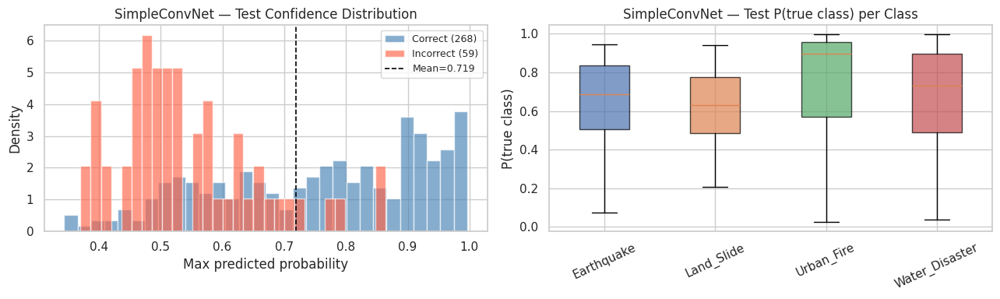

In [48]:
plot_model_eval(probs_test_simple, y_test, 'SimpleConvNet', 'Test',
                save_prefix='simple_test')


#### 7.2.3 Ensemble — Test



  Ensemble  |  Test Set
                precision    recall  f1-score   support

    Earthquake     0.8769    0.9048    0.8906        63
    Land_Slide     0.7969    0.8947    0.8430        57
    Urban_Fire     0.9804    0.8621    0.9174        58
Water_Disaster     0.9320    0.9195    0.9257       149

      accuracy                         0.9021       327
     macro avg     0.8965    0.8953    0.8942       327
  weighted avg     0.9064    0.9021    0.9030       327



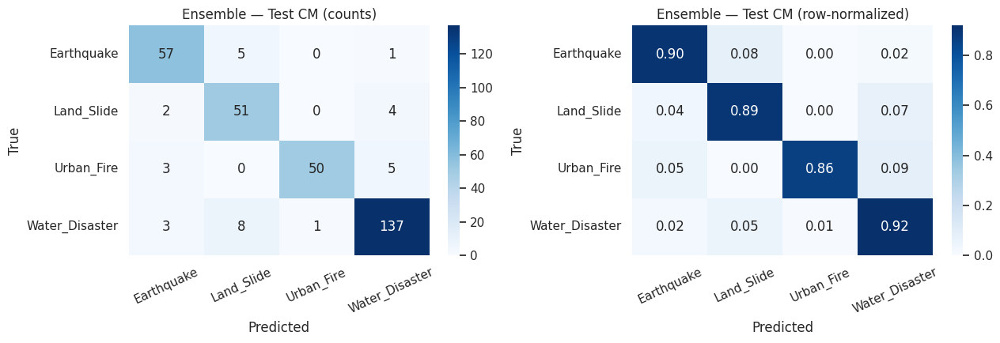

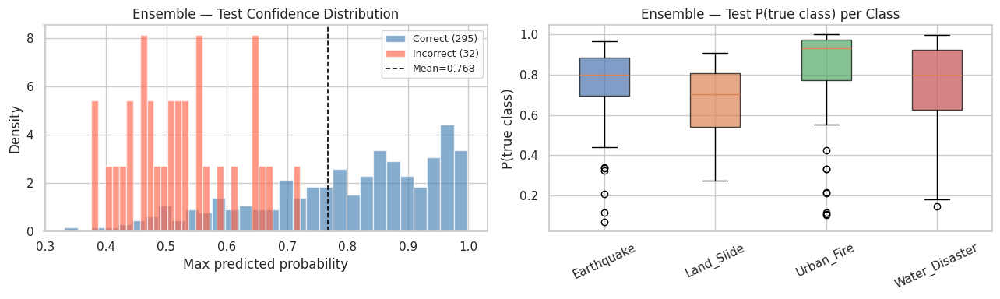

In [49]:
plot_model_eval(ens_probs_test, y_test, 'Ensemble', 'Test',
                preds=ens_preds_test, save_prefix='ensemble_test')


#### 7.2.4 Recap — Test


In [50]:
from statsmodels.stats.proportion import proportion_confint

_recap_test = {}
for _name, _probs, _preds in [
    ('EfficientNetB2', probs_test_effnet, probs_test_effnet.argmax(1)),
    ('SimpleConvNet',  probs_test_simple, probs_test_simple.argmax(1)),
    ('Ensemble',       ens_probs_test,    ens_preds_test),
]:
    _recap_test[_name] = {
        'accuracy'    : accuracy_score(y_test, _preds),
        'f1_macro'    : f1_score(y_test, _preds, average='macro'),
        'balanced_acc': balanced_accuracy_score(y_test, _preds),
    }

print('\n=== Test Recap ===')
print(pd.DataFrame(_recap_test).T.round(4).to_string())

_acc_t = _recap_test['Ensemble']['accuracy']; _n_t = len(y_test)
_lo, _hi = proportion_confint(int(_acc_t * _n_t), _n_t, alpha=0.05, method='wilson')
print(f'\nEnsemble test accuracy = {_acc_t:.4f}  '
      f'Wilson 95% CI = [{_lo:.4f}, {_hi:.4f}]')



=== Test Recap ===
                accuracy  f1_macro  balanced_acc
EfficientNetB2    0.9113    0.9026        0.8974
SimpleConvNet     0.8196    0.8146        0.8245
Ensemble          0.9021    0.8942        0.8953

Ensemble test accuracy = 0.9021  Wilson 95% CI = [0.8651, 0.9298]


## 8. Error Analysis


In [51]:
def show_errors(probs, preds, y, model_name, test_df=test_df, top_n=8):
    margin  = np.sort(probs, 1)[:, -1] - np.sort(probs, 1)[:, -2]
    entropy = -(probs * np.log(np.clip(probs, 1e-9, 1))).sum(1)

    df = pd.DataFrame({
        'path'      : test_df.path.values,
        'true'      : [CLASSES[i] for i in y],
        'pred'      : [CLASSES[i] for i in preds],
        'confidence': probs.max(1),
        'margin'    : margin,
        'entropy'   : entropy,
    })
    df['correct'] = df.true == df.pred
    errors = df[~df.correct]

    print(f'\n[{model_name}]  errors: {len(errors)}/{len(df)}'
          f'  ({len(errors)/len(df)*100:.1f}%)')
    print(f'  Mean confidence — correct  : {df.loc[df.correct, "confidence"].mean():.3f}')
    print(f'  Mean confidence — incorrect: {df.loc[~df.correct, "confidence"].mean():.3f}')
    print('\n  Top confusion pairs:')
    top_pairs = (errors.groupby(['true','pred']).size()
                 .reset_index(name='n').sort_values('n', ascending=False).head(top_n))
    print(top_pairs.to_string(index=False))

    recall_per_class = [
        (df[df.true == c]['correct'].mean() if (df.true == c).any() else 0.0)
        for c in CLASSES
    ]
    fig, axes = plt.subplots(1, 2, figsize=(13, 4))
    axes[0].bar(CLASSES, recall_per_class,
                color=['#4C72B0','#DD8452','#55A868','#C44E52'], alpha=0.85)
    axes[0].set_ylim(0, 1.05); axes[0].set_ylabel('Recall')
    axes[0].set_title(f'{model_name} — Per-class Recall (test)')
    axes[0].tick_params(axis='x', rotation=25)
    for xi, v in enumerate(recall_per_class):
        axes[0].text(xi, v + 0.01, f'{v:.2f}', ha='center', fontsize=9)

    err_classes = errors['true'].unique()
    err_conf_by_class = [errors.loc[errors.true == c, 'confidence'].values
                         for c in CLASSES]
    axes[1].boxplot([x if len(x) > 0 else [0] for x in err_conf_by_class],
                    labels=CLASSES, patch_artist=True)
    axes[1].set_title(f'{model_name} — Error Confidence by True Class')
    axes[1].set_ylabel('Confidence at error')
    axes[1].tick_params(axis='x', rotation=25)

    plt.tight_layout(); plt.show()
    return df, errors


### 8.1 EfficientNetB2 — Error Analysis



[EfficientNetB2]  errors: 29/327  (8.9%)
  Mean confidence — correct  : 0.847
  Mean confidence — incorrect: 0.577

  Top confusion pairs:
          true           pred  n
    Land_Slide Water_Disaster  7
    Earthquake     Land_Slide  6
Water_Disaster     Land_Slide  5
    Urban_Fire Water_Disaster  5
Water_Disaster     Earthquake  2
    Land_Slide     Earthquake  2
    Urban_Fire     Land_Slide  1
Water_Disaster     Urban_Fire  1


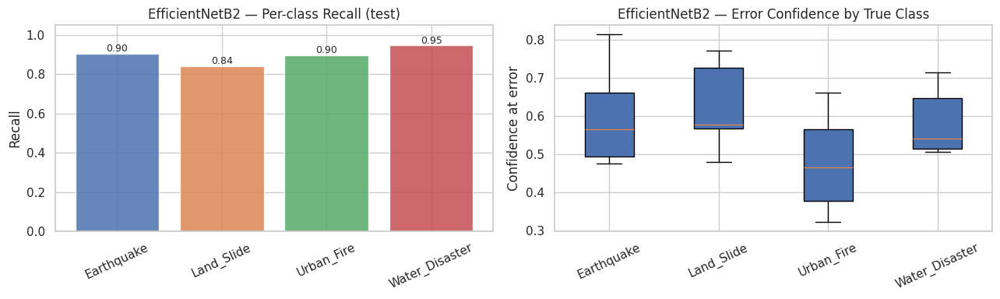

In [52]:
_ea_effnet_df, _ea_effnet_errors = show_errors(
    probs_test_effnet, probs_test_effnet.argmax(1),
    y_test, 'EfficientNetB2')


### 8.2 SimpleConvNet — Error Analysis



[SimpleConvNet]  errors: 59/327  (18.0%)
  Mean confidence — correct  : 0.758
  Mean confidence — incorrect: 0.542

  Top confusion pairs:
          true           pred  n
Water_Disaster     Land_Slide 19
    Earthquake     Land_Slide  8
    Land_Slide Water_Disaster  8
    Urban_Fire Water_Disaster  6
Water_Disaster     Urban_Fire  5
Water_Disaster     Earthquake  5
    Land_Slide     Earthquake  3
    Earthquake Water_Disaster  2


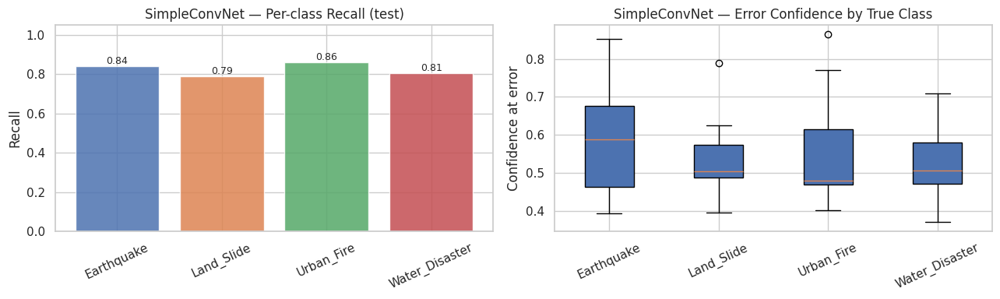

In [53]:
_ea_simple_df, _ea_simple_errors = show_errors(
    probs_test_simple, probs_test_simple.argmax(1),
    y_test, 'SimpleConvNet')


### 8.3 Ensemble — Error Analysis



[Ensemble]  errors: 32/327  (9.8%)
  Mean confidence — correct  : 0.794
  Mean confidence — incorrect: 0.523

  Top confusion pairs:
          true           pred  n
Water_Disaster     Land_Slide  8
    Earthquake     Land_Slide  5
    Urban_Fire Water_Disaster  5
    Land_Slide Water_Disaster  4
    Urban_Fire     Earthquake  3
Water_Disaster     Earthquake  3
    Land_Slide     Earthquake  2
    Earthquake Water_Disaster  1


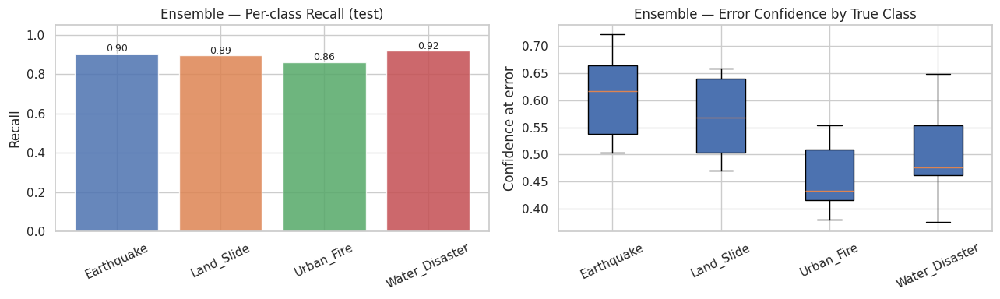

In [54]:
_ea_ens_df, _ea_ens_errors = show_errors(
    ens_probs_test, ens_preds_test,
    y_test, 'Ensemble')


## 9. Model Explainability — Grad-CAM


In [55]:
def make_gradcam_heatmap(model, img_array, last_conv_layer_name, pred_index=None):
    """Generate Grad-CAM heatmap for a Keras model."""
    grad_model = keras.Model(
        model.inputs,
        [model.get_layer(last_conv_layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_out, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_ch = preds[:, pred_index]
    grads  = tape.gradient(class_ch, conv_out)
    pooled = tf.reduce_mean(grads, axis=(0, 1, 2))
    heatmap = tf.squeeze(conv_out[0] @ pooled[..., tf.newaxis])
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy()


def get_last_conv_layer(model):
    for layer in reversed(model.layers):
        try:
            shp = layer.output.shape
        except Exception:
            try:
                shp = layer.output_shape
            except Exception:
                continue
        if shp is not None and len(shp) == 4:
            return layer.name
    return None


def cam_overlay(model, img_path, target_class, raw_input=False):
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (cfg.IMG_SIZE, cfg.IMG_SIZE))
    img_norm = img.astype(np.float32) / 255.0
    img_input = (img.astype(np.float32) if raw_input
                 else preprocess_input(img.astype(np.float32)))[np.newaxis, ...]
    last_conv = get_last_conv_layer(model)
    if last_conv is None:
        return img_norm
    heatmap = make_gradcam_heatmap(model, img_input, last_conv, target_class)
    heatmap = cv2.resize(heatmap, (cfg.IMG_SIZE, cfg.IMG_SIZE))
    heatmap_color = cv2.cvtColor(
        cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET),
        cv2.COLOR_BGR2RGB
    ) / 255.0
    return np.clip(heatmap_color * 0.4 + img_norm, 0, 1)


def show_gradcam(model, model_name, df_show, raw_input=False, n=4, title=''):
    """Show original + Grad-CAM overlay for a single model."""
    df_show = df_show.head(n)
    n_show  = len(df_show)
    if n_show == 0:
        print(f'No samples for {model_name} — {title}'); return
    fig, axes = plt.subplots(n_show, 2, figsize=(8, 3.2 * n_show))
    if n_show == 1:
        axes = axes[np.newaxis, :]
    for i, (_, r) in enumerate(df_show.iterrows()):
        img = cv2.cvtColor(cv2.imread(r['path']), cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (cfg.IMG_SIZE, cfg.IMG_SIZE))
        axes[i, 0].imshow(img); axes[i, 0].axis('off')
        axes[i, 0].set_title(f"True: {r['true']}\nPred: {r['pred']}", fontsize=8)
        try:
            ov = cam_overlay(model, r['path'], CLS2IDX[r['pred']], raw_input=raw_input)
            axes[i, 1].imshow(ov)
            axes[i, 1].set_title(f'Grad-CAM: {model_name}', fontsize=8)
        except Exception as e:
            axes[i, 1].text(0.5, 0.5, f'err:{e}', ha='center', fontsize=7)
        axes[i, 1].axis('off')
    plt.suptitle(f'{model_name} — {title}', fontsize=11, fontweight='bold')
    plt.tight_layout()
    _fn = f'gradcam_{model_name.lower().replace(" ","_")}_{title[:15].replace(" ","_")}.png'
    plt.savefig(cfg.OUTPUT_DIR + _fn, dpi=120)
    plt.show()


print('Grad-CAM functions ready.')


Grad-CAM functions ready.


### 9.1 EfficientNetB2 — Grad-CAM


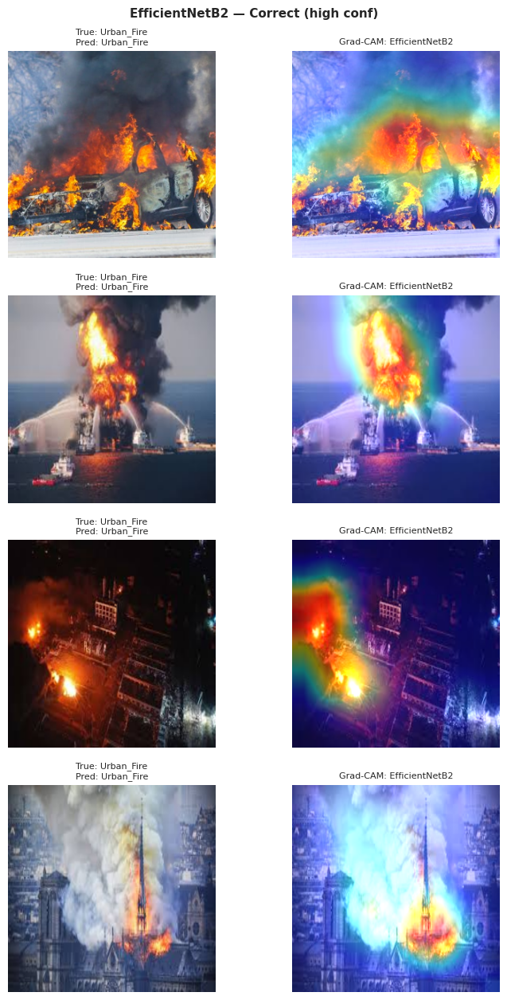

In [56]:
_effnet_correct_top = (_ea_effnet_df[_ea_effnet_df.correct]
                        .sort_values('confidence', ascending=False).head(4))
show_gradcam(effnet_model, 'EfficientNetB2', _effnet_correct_top,
             raw_input=True, n=4, title='Correct (high conf)')


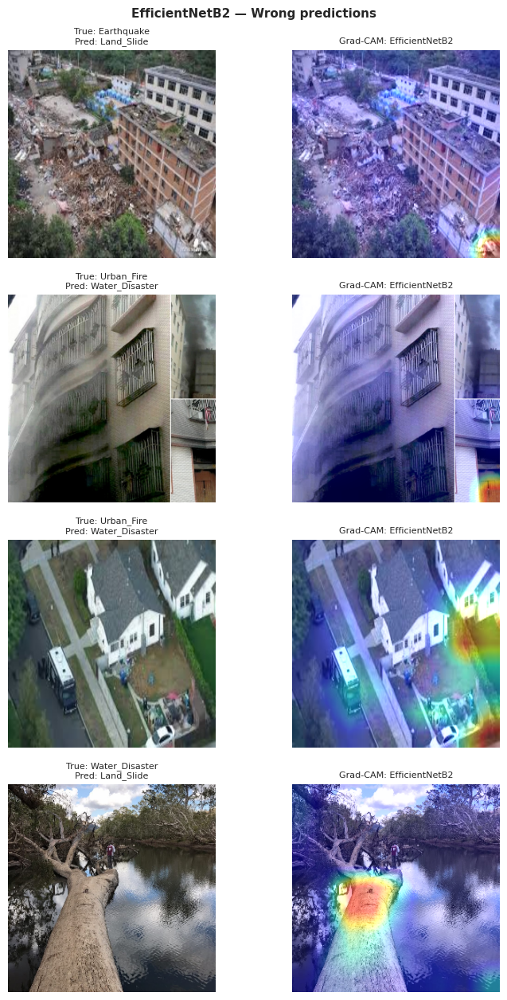

In [57]:
show_gradcam(effnet_model, 'EfficientNetB2', _ea_effnet_errors.head(4),
             raw_input=True, n=4, title='Wrong predictions')


### 9.2 SimpleConvNet — Grad-CAM


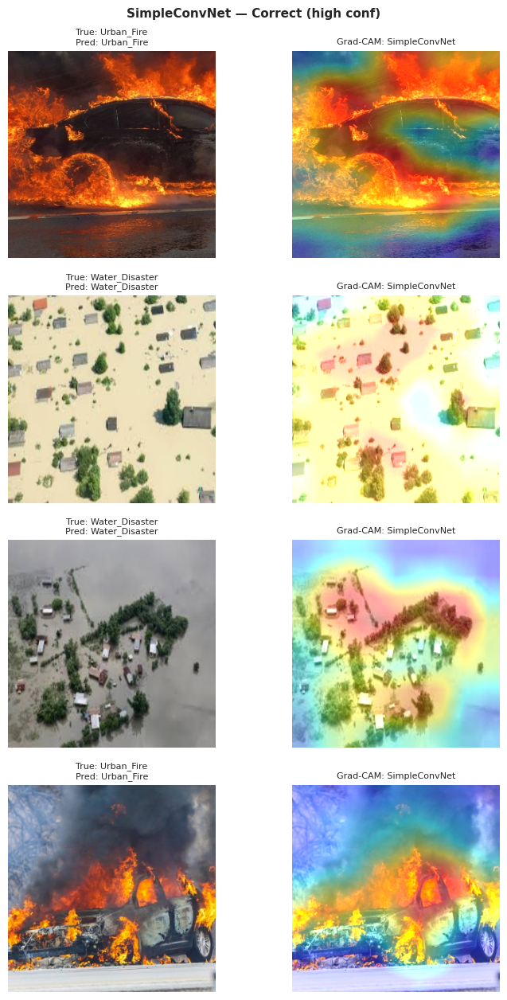

In [58]:
_simple_correct_top = (_ea_simple_df[_ea_simple_df.correct]
                        .sort_values('confidence', ascending=False).head(4))
show_gradcam(simple_model, 'SimpleConvNet', _simple_correct_top,
             raw_input=False, n=4, title='Correct (high conf)')


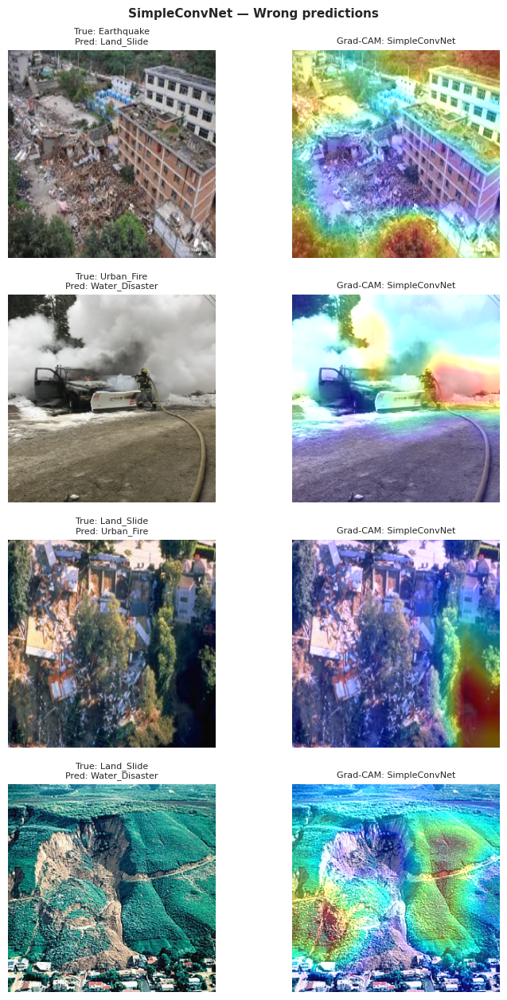

In [59]:
show_gradcam(simple_model, 'SimpleConvNet', _ea_simple_errors.head(4),
             raw_input=False, n=4, title='Wrong predictions')


**Interpretasi.** Pada prediksi benar, attention model fokus pada area disaster-specific (api, retakan, banjir). Pada error, attention sering bocor ke background — indikasi feature representation kurang diskriminatif untuk kasus ambiguous.


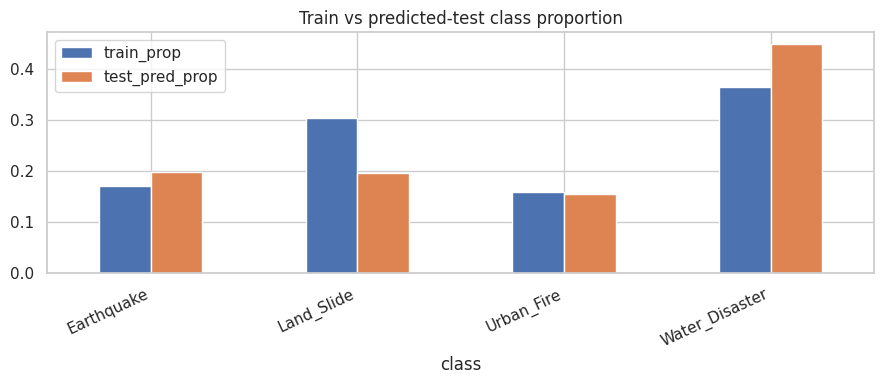

Chi-square (test pred vs train prop): stat=20.475, p=0.0001


In [60]:
train_dist  = train_df.label.value_counts(normalize=True).reindex(CLASSES).fillna(0).values
test_counts = np.bincount(ens_preds_test, minlength=cfg.NUM_CLASSES)
test_dist   = test_counts / test_counts.sum()

pd.DataFrame({'class': CLASSES,
              'train_prop': train_dist,
              'test_pred_prop': test_dist
             }).plot(x='class', y=['train_prop','test_pred_prop'],
                     kind='bar', figsize=(9, 4))
plt.title('Train vs predicted-test class proportion')
plt.xticks(rotation=25, ha='right'); plt.tight_layout()
plt.savefig(cfg.OUTPUT_DIR + 'pred_distribution.png', dpi=120)
plt.show()

chi2 = chisquare(test_counts, train_dist * test_counts.sum())
print(f'Chi-square (test pred vs train prop): stat={chi2.statistic:.3f}, p={chi2.pvalue:.4f}')
